In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import skimage.io
import glob
#import pandas as pd
import gdal
# Root directory of the project
ROOT_DIR = os.path.abspath("../../")
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
# Import Mask RCNN

from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log
import keras.backend as K

#from samples.building import building
%matplotlib inline 

C:\Users\zhangc\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\zhangc\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\zhangc\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\zhangc\AppData\Local\C

In [5]:
#print (sys.path)
print (tf.__version__)
print (np.__version__)
print (tf.keras.__version__)


1.14.0
1.17.2
2.2.4-tf


In [2]:
# Dataset directory
DATASET_DIR = r"C:\projects\landClassification\footPrintMRCNN"  #os.path.join(ROOT_DIR, "datasets/nucleus")
DATASET_DIRVAL= r"C:\projects\landClassification\footPrintMRCNNVAL"  #os.path.join(ROOT_DIR, "datasets/nucleus")
print (DATASET_DIR)

C:\projects\landClassification\footPrintMRCNN


In [3]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [4]:
class cobbConfig(Config):
    """Configuration for training on MS COCO.
    Derives from the base Config class and overrides values specific
    to the COCO dataset.
    """
    # Give the configuration a recognizable name
    NAME = "cobb"
    
    # We use a GPU with 12GB memory, which can fit two images.
    # Adjust down if you use a smaller GPU.
    IMAGES_PER_GPU = 1
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)
    # Uncomment to train on 8 GPUs (default is 1)
    # GPU_COUNT = 8
    DETECTION_MIN_CONFIDENCE = 0.95
    
    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # Background + cobb building
    IMAGE_MAX_DIM=512
    IMAGE_MIN_DIM=512
    STEPS_PER_EPOCH = 200
    VALIDATION_STEPS = 50
    
config = cobbConfig()
print (config.IMAGE_SHAPE)
config.display()

[512 512   3]

Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.95
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHA

In [98]:
class cobbDataset(utils.Dataset):
    def load_cobb(self, dataset_dir):
        """Load a subset of the Cobb dataset.
        dataset_dir: The root directory of the pictometry dataset.
        class_ids: If provided, only loads images that have the given classes.
        class_map: TODO: Not implemented yet. Supports maping classes from
            different datasets to the same class ID.
         Load a subset of the Cobb dataset from the given dataset_dir.
        """
        # Add classes
        self.add_class("cobb", 1, "building")
        #loading images
        self._image_dir = os.path.join(dataset_dir, "images1/")
        self._mask_dir = os.path.join(dataset_dir, "labels/")
        i=0
        for f in glob.glob(os.path.join(self._image_dir, "*.tif")):
            filename = os.path.split(f)[1]
            self.add_image("cobb", image_id=i, path=f,
                          width=config.IMAGE_SHAPE[0], height=config.IMAGE_SHAPE[1], filename=filename)
            i += 1
            if i>3800:
                break
            #print (filename)
            
    def load_mask(self, image_id):
        """Load instance masks for the given image.

        Different datasets use different ways to store masks. This
        function converts the different mask format to one format
        in the form of a bitmap [height, width, instances].

        Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a COCO image, delegate to parent class.
        """Read instance masks for an image.
        Returns:
        masks: A bool array of shape [height, width, instance count] with one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
#        self._mask_dir = os.path.join(dataset_dir, "labels")
        info = self.image_info[image_id]
        fname = info["filename"]
        masks = []
        class_ids = []
        #looping through all the classes, loading and processing corresponding masks
#         for ci in self.class_info:
#             class_name = ci["name"]
#             class_id = ci["id"]
#             try:
        m_src = skimage.io.imread(os.path.join(self._mask_dir, "1", fname))
#            except:
                #no file with masks of this class found
#                continue                
            #making individual masks for each instance
        instance_ids = np.unique(m_src)
        print (instance_ids)
        for i in instance_ids:
            if i > 0:
                m = np.zeros(m_src.shape)
                m[m_src==i] = i
                print(i)
                if np.any(m==i):
                    masks.append(m)
#                        class_ids.append(class_id)
        try:
            masks = np.stack(masks, axis=-1)        
        except:
            print("!There were no mask.", info)
            
        # Return mask, and array of class IDs of each instance.
        return masks.astype(np.bool), np.ones([masks.shape[-1]], dtype=np.int32)
    
    def image_reference(self, image_id):
        """Return a link to the image in the COCO Website."""
        info = self.image_info[image_id]
        if info["source"] == "cobb":
            return info["cobb"]
        else:
            super(self.__class__).image_reference(self, image_id)


In [99]:
# Load dataset
dataset = cobbDataset()
# The subset is the name of the sub-directory, such as stage1_train,
# stage1_test, ...etc. You can also use these special values:
#     train: loads stage1_train but excludes validation images
#     val: loads validation images from stage1_train. For a list
#          of validation images see nucleus.py
dataset.load_cobb(DATASET_DIR)

# Must call before using the dataset
dataset.prepare()
print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 3801
Class Count: 2
  0. BG                                                
  1. building                                          


3780
[0 1 2]
1
2


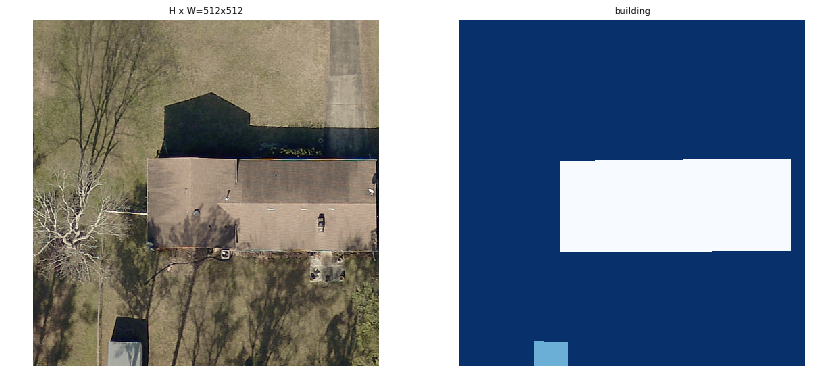

2119
[0 1 2 3]
1
2
3


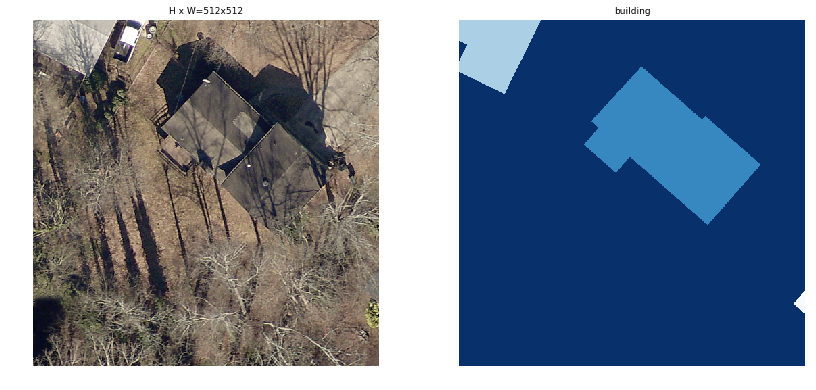

2414
[0 1 2]
1
2


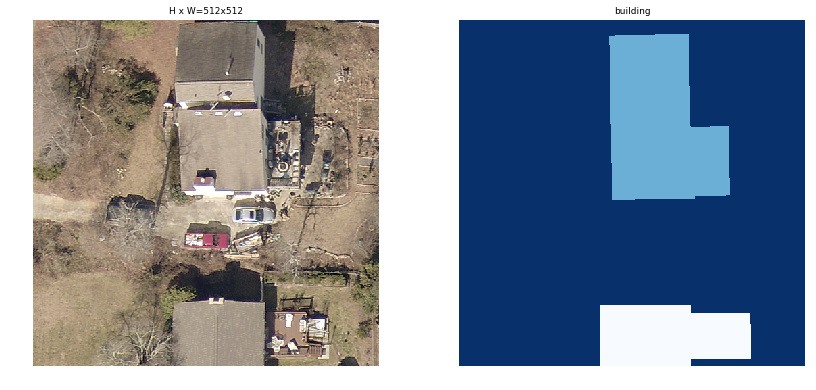

716
[0 1 2]
1
2


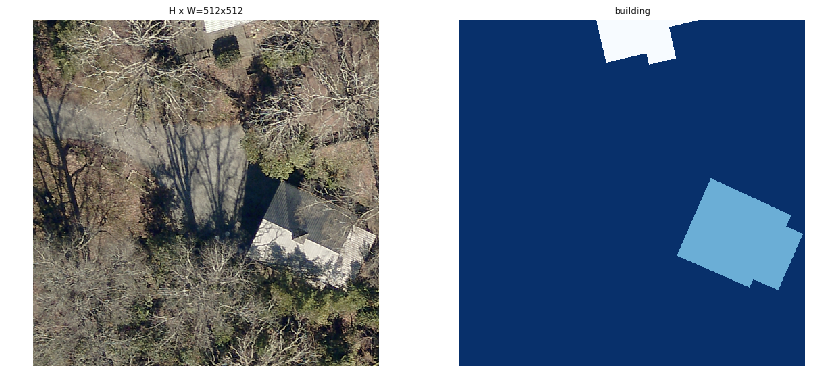

In [160]:
image_ids = np.random.choice(dataset.image_ids,4)
#print (image_ids)
for image_id in image_ids:
    print (image_id)
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names,limit=1)

In [101]:
dataset_val = cobbDataset()
# The subset is the name of the sub-directory, such as stage1_train,
# stage1_test, ...etc. You can also use these special values:
#     train: loads stage1_train but excludes validation images
#     val: loads validation images from stage1_train. For a list
#          of validation images see nucleus.py
dataset_val.load_cobb(DATASET_DIRVAL)
# Must call before using the dataset
dataset_val.prepare()
print("Image Count: {}".format(len(dataset_val.image_ids)))
print("Class Count: {}".format(dataset_val.num_classes))
for i, info in enumerate(dataset_val.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 303
Class Count: 2
  0. BG                                                
  1. building                                          


In [102]:

# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=DATASET_DIR)

In [103]:
# Which weights to start with?
init_with = "imagenet"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last(), by_name=True)

In [104]:
# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.
model.train(dataset, dataset_val, 
            learning_rate=config.LEARNING_RATE*2, 
            epochs=8, 
            layers='heads')


Starting at epoch 0. LR=0.002

Checkpoint Path: C:\projects\landClassification\footPrintMRCNN\cobb20190915T1114\mask_rcnn_cobb_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistribu

C:\Users\zhangc\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\ops\gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\zhangc\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\ops\gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\zhangc\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\ops\gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/8
[0 1 2]
1
2
  1/200 [..............................] - ETA: 1:27:53 - loss: 5.5847 - rpn_class_loss: 2.3531 - rpn_bbox_loss: 1.4578 - mrcnn_class_loss: 1.7738 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00[0 1]
1
  2/200 [..............................] - ETA: 1:15:41 - loss: 5.2505 - rpn_class_loss: 2.1186 - rpn_bbox_loss: 1.8502 - mrcnn_class_loss: 1.2817 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00[0 1]
1
  3/200 [..............................] - ETA: 1:11:44 - loss: 4.3882 - rpn_class_loss: 1.7655 - rpn_bbox_loss: 1.6547 - mrcnn_class_loss: 0.9680 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00[0 1]
1
  4/200 [..............................] - ETA: 1:09:24 - loss: 4.3488 - rpn_class_loss: 1.4040 - rpn_bbox_loss: 1.4729 - mrcnn_class_loss: 0.8563 - mrcnn_bbox_loss: 0.4360 - mrcnn_mask_loss: 0.1796        [0 1 2 3]
1
2
3
  5/200 [..............................] - ETA: 1:07:46 - loss: 4.3940 - rpn_class_loss: 1.1756 - rpn_bbox_loss: 1

 79/200 [==========>...................] - ETA: 39:25 - loss: 3.7731 - rpn_class_loss: 0.1310 - rpn_bbox_loss: 1.7027 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 1.2411 - mrcnn_mask_loss: 0.6017[0 1 2]
1
2
 80/200 [===========>..................] - ETA: 39:05 - loss: 3.7918 - rpn_class_loss: 0.1330 - rpn_bbox_loss: 1.7234 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 1.2361 - mrcnn_mask_loss: 0.6036[0 1 2]
1
2
 81/200 [===========>..................] - ETA: 38:45 - loss: 3.7764 - rpn_class_loss: 0.1316 - rpn_bbox_loss: 1.7132 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 1.2320 - mrcnn_mask_loss: 0.6034[0 1]
1
 82/200 [===========>..................] - ETA: 38:26 - loss: 3.7663 - rpn_class_loss: 0.1303 - rpn_bbox_loss: 1.7117 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 1.2257 - mrcnn_mask_loss: 0.6031[0 1 2]
1
2
 83/200 [===========>..................] - ETA: 38:06 - loss: 3.7492 - rpn_class_loss: 0.1291 - rpn_bbox_loss: 1.7046 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 1.2177 -

157/200 [======================>.......] - ETA: 14:02 - loss: 3.4068 - rpn_class_loss: 0.1061 - rpn_bbox_loss: 1.6135 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 1.0125 - mrcnn_mask_loss: 0.5953[0 1 2]
1
2
158/200 [======================>.......] - ETA: 13:43 - loss: 3.4016 - rpn_class_loss: 0.1057 - rpn_bbox_loss: 1.6111 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 1.0104 - mrcnn_mask_loss: 0.5949[0 1 2 3]
1
2
3
159/200 [======================>.......] - ETA: 13:23 - loss: 3.3981 - rpn_class_loss: 0.1055 - rpn_bbox_loss: 1.6102 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 1.0079 - mrcnn_mask_loss: 0.5950[0 1]
1
160/200 [=======================>......] - ETA: 13:04 - loss: 3.3944 - rpn_class_loss: 0.1050 - rpn_bbox_loss: 1.6078 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 1.0069 - mrcnn_mask_loss: 0.5952[0 1]
1
161/200 [=======================>......] - ETA: 12:44 - loss: 3.3842 - rpn_class_loss: 0.1045 - rpn_bbox_loss: 1.6004 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 1.0049 -

 34/200 [====>.........................] - ETA: 57:11 - loss: 2.4062 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 1.0245 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.6507 - mrcnn_mask_loss: 0.5965[0 1 2]
1
2
 35/200 [====>.........................] - ETA: 56:51 - loss: 2.3916 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 1.0126 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.6505 - mrcnn_mask_loss: 0.5953[0 1]
1
 36/200 [====>.........................] - ETA: 56:31 - loss: 2.3818 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 0.9969 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.6601 - mrcnn_mask_loss: 0.5927[0 1 2]
1
2
 37/200 [====>.........................] - ETA: 56:10 - loss: 2.3811 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 1.0043 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.6529 - mrcnn_mask_loss: 0.5920[0 1 2]
1
2
 38/200 [====>.........................] - ETA: 55:49 - loss: 2.3606 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 0.9840 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.6543 -

112/200 [===============>..............] - ETA: 30:23 - loss: 2.4468 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 1.0223 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.6885 - mrcnn_mask_loss: 0.6108[0 1]
1
113/200 [===============>..............] - ETA: 30:02 - loss: 2.4481 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 1.0239 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.6881 - mrcnn_mask_loss: 0.6114[0 1 2]
1
2
114/200 [================>.............] - ETA: 29:41 - loss: 2.4476 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 1.0226 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.6886 - mrcnn_mask_loss: 0.6115[0 1]
1
115/200 [================>.............] - ETA: 29:21 - loss: 2.4501 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 1.0242 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.6893 - mrcnn_mask_loss: 0.6119[0 1 2 3]
1
2
3
116/200 [================>.............] - ETA: 29:00 - loss: 2.4475 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 1.0206 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.6900 -

190/200 [===========================>..] - ETA: 3:27 - loss: 2.4320 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 1.0249 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.6909 - mrcnn_mask_loss: 0.6020[0 1]
1
191/200 [===========================>..] - ETA: 3:06 - loss: 2.4313 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 1.0248 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.6909 - mrcnn_mask_loss: 0.6016[0 1]
1
192/200 [===========================>..] - ETA: 2:45 - loss: 2.4278 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 1.0283 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.6873 - mrcnn_mask_loss: 0.5985[0 1]
1
193/200 [===========================>..] - ETA: 2:24 - loss: 2.4247 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 1.0245 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.6876 - mrcnn_mask_loss: 0.5991[0 1]
1
194/200 [============================>.] - ETA: 2:04 - loss: 2.4190 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 1.0213 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.6856 - mrcnn_mask_loss:

 67/200 [=========>....................] - ETA: 46:02 - loss: 2.1065 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.7960 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.6141 - mrcnn_mask_loss: 0.6014[0 1]
1
 68/200 [=========>....................] - ETA: 45:41 - loss: 2.1102 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.7932 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.6188 - mrcnn_mask_loss: 0.6034[0 1 2]
1
2
 69/200 [=========>....................] - ETA: 45:20 - loss: 2.1111 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.7985 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.6158 - mrcnn_mask_loss: 0.6019[0 1]
1
 70/200 [=========>....................] - ETA: 44:59 - loss: 2.0990 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.7884 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.6145 - mrcnn_mask_loss: 0.6017[0 1]
1
 71/200 [=========>....................] - ETA: 44:38 - loss: 2.0976 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.7872 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.6139 - mrcnn_m

145/200 [====================>.........] - ETA: 19:00 - loss: 2.1067 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.8273 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.6113 - mrcnn_mask_loss: 0.5732[0 1 2]
1
2
146/200 [====================>.........] - ETA: 18:40 - loss: 2.1138 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.8324 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.6124 - mrcnn_mask_loss: 0.5727[0 1]
1
147/200 [=====================>........] - ETA: 18:19 - loss: 2.1146 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.8345 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.6114 - mrcnn_mask_loss: 0.5727[0 1]
1
148/200 [=====================>........] - ETA: 17:58 - loss: 2.1133 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.8352 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.6101 - mrcnn_mask_loss: 0.5723[0 1 2]
1
2
149/200 [=====================>........] - ETA: 17:37 - loss: 2.1253 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.8461 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.6112 - mrc

 22/200 [==>...........................] - ETA: 1:02:10 - loss: 2.4057 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 1.0182 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.6557 - mrcnn_mask_loss: 0.6197[0 1]
1
 23/200 [==>...........................] - ETA: 1:01:45 - loss: 2.3757 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.9912 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.6547 - mrcnn_mask_loss: 0.6192[0 1 2]
1
2
 24/200 [==>...........................] - ETA: 1:01:21 - loss: 2.3460 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 0.9684 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.6494 - mrcnn_mask_loss: 0.6172[0 1 2]
1
2
 25/200 [==>...........................] - ETA: 1:00:58 - loss: 2.3054 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 0.9356 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.6444 - mrcnn_mask_loss: 0.6142[0 1]
1
 26/200 [==>...........................] - ETA: 1:00:36 - loss: 2.3303 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 0.9515 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.

100/200 [==============>...............] - ETA: 34:35 - loss: 2.0588 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.8076 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.5985 - mrcnn_mask_loss: 0.5571[0 1]
1
101/200 [==============>...............] - ETA: 34:15 - loss: 2.0558 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.8030 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.5982 - mrcnn_mask_loss: 0.5592[0 1]
1
102/200 [==============>...............] - ETA: 33:54 - loss: 2.0611 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.8174 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5923 - mrcnn_mask_loss: 0.5537[0 1]
1
103/200 [==============>...............] - ETA: 33:33 - loss: 2.0635 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.8166 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5949 - mrcnn_mask_loss: 0.5547[0 1]
1
104/200 [==============>...............] - ETA: 33:12 - loss: 2.0627 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.8138 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5961 - mrcnn_mask_

178/200 [=========================>....] - ETA: 7:47 - loss: 2.0640 - rpn_class_loss: 0.0394 - rpn_bbox_loss: 0.8170 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5980 - mrcnn_mask_loss: 0.5523[0 1]
1
179/200 [=========================>....] - ETA: 7:26 - loss: 2.0611 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.8210 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5947 - mrcnn_mask_loss: 0.5492[0 1]
1
180/200 [==========================>...] - ETA: 7:05 - loss: 2.0715 - rpn_class_loss: 0.0396 - rpn_bbox_loss: 0.8283 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5966 - mrcnn_mask_loss: 0.5501[0 1 2]
1
2
181/200 [==========================>...] - ETA: 6:44 - loss: 2.0722 - rpn_class_loss: 0.0396 - rpn_bbox_loss: 0.8306 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5958 - mrcnn_mask_loss: 0.5495[0 1]
1
182/200 [==========================>...] - ETA: 6:23 - loss: 2.0678 - rpn_class_loss: 0.0394 - rpn_bbox_loss: 0.8287 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5937 - mrcnn_mask_l

 55/200 [=======>......................] - ETA: 53:59 - loss: 2.1244 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.9306 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.5291[0 1 2]
1
2
 56/200 [=======>......................] - ETA: 53:37 - loss: 2.1723 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.9823 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5559 - mrcnn_mask_loss: 0.5264[0 1 2]
1
2
 57/200 [=======>......................] - ETA: 53:15 - loss: 2.1660 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 0.9782 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5541 - mrcnn_mask_loss: 0.5264[0 1]
1
 58/200 [=======>......................] - ETA: 52:53 - loss: 2.1567 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.9707 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5539 - mrcnn_mask_loss: 0.5257[0 1 2]
1
2
 59/200 [=======>......................] - ETA: 52:30 - loss: 2.1515 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.9622 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.5562 -

133/200 [==================>...........] - ETA: 24:57 - loss: 2.0272 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.8472 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5593 - mrcnn_mask_loss: 0.5238[0 1 2 3]
1
2
3
134/200 [===================>..........] - ETA: 24:34 - loss: 2.0273 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.8463 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5595 - mrcnn_mask_loss: 0.5242[0 1 2 3]
1
2
3
135/200 [===================>..........] - ETA: 24:12 - loss: 2.0241 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.8423 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5597 - mrcnn_mask_loss: 0.5245[0 1]
1
136/200 [===================>..........] - ETA: 23:50 - loss: 2.0214 - rpn_class_loss: 0.0459 - rpn_bbox_loss: 0.8402 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5599 - mrcnn_mask_loss: 0.5239[0 1 2]
1
2
137/200 [===================>..........] - ETA: 23:28 - loss: 2.0332 - rpn_class_loss: 0.0477 - rpn_bbox_loss: 0.8477 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 

 10/200 [>.............................] - ETA: 1:10:31 - loss: 1.8957 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.6736 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5652 - mrcnn_mask_loss: 0.5529[0 1 2]
1
2
 11/200 [>.............................] - ETA: 1:10:07 - loss: 1.8694 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.6409 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.5877 - mrcnn_mask_loss: 0.5399[0 1]
1
 12/200 [>.............................] - ETA: 1:09:46 - loss: 1.8197 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.6891 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.5387 - mrcnn_mask_loss: 0.4949[0 1 2]
1
2
 13/200 [>.............................] - ETA: 1:09:20 - loss: 1.8342 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.7137 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.5264 - mrcnn_mask_loss: 0.4963[0 1]
1
 14/200 [=>............................] - ETA: 1:08:58 - loss: 1.8076 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.6972 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.

 88/200 [============>.................] - ETA: 40:24 - loss: 1.9630 - rpn_class_loss: 0.0449 - rpn_bbox_loss: 0.8135 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5432 - mrcnn_mask_loss: 0.5047[0 1]
1
 89/200 [============>.................] - ETA: 40:02 - loss: 1.9577 - rpn_class_loss: 0.0448 - rpn_bbox_loss: 0.8125 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5396 - mrcnn_mask_loss: 0.5046[0 1 2]
1
2
 90/200 [============>.................] - ETA: 39:39 - loss: 1.9571 - rpn_class_loss: 0.0447 - rpn_bbox_loss: 0.8242 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5336 - mrcnn_mask_loss: 0.4990[0 1 2]
1
2
 91/200 [============>.................] - ETA: 39:16 - loss: 1.9585 - rpn_class_loss: 0.0446 - rpn_bbox_loss: 0.8247 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5354 - mrcnn_mask_loss: 0.4984[0 1]
1
 92/200 [============>.................] - ETA: 38:53 - loss: 1.9584 - rpn_class_loss: 0.0444 - rpn_bbox_loss: 0.8194 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5374 - mrc

166/200 [=======================>......] - ETA: 12:00 - loss: 1.9079 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.7704 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5412 - mrcnn_mask_loss: 0.4983[0 1]
1
167/200 [========================>.....] - ETA: 11:39 - loss: 1.9057 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.7692 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5415 - mrcnn_mask_loss: 0.4972[0 1]
1
168/200 [========================>.....] - ETA: 11:18 - loss: 1.9094 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.7718 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.5421 - mrcnn_mask_loss: 0.4980[0 1 2]
1
2
169/200 [========================>.....] - ETA: 10:57 - loss: 1.9079 - rpn_class_loss: 0.0395 - rpn_bbox_loss: 0.7704 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.5424 - mrcnn_mask_loss: 0.4977[0 1 2]
1
2
170/200 [========================>.....] - ETA: 10:35 - loss: 1.9065 - rpn_class_loss: 0.0395 - rpn_bbox_loss: 0.7679 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5438 - mrc

 43/200 [=====>........................] - ETA: 54:59 - loss: 1.8118 - rpn_class_loss: 0.0327 - rpn_bbox_loss: 0.6800 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.5410 - mrcnn_mask_loss: 0.4915[0 1]
1
 44/200 [=====>........................] - ETA: 54:37 - loss: 1.7987 - rpn_class_loss: 0.0322 - rpn_bbox_loss: 0.6700 - mrcnn_class_loss: 0.0654 - mrcnn_bbox_loss: 0.5424 - mrcnn_mask_loss: 0.4886[0 1]
1
 45/200 [=====>........................] - ETA: 54:15 - loss: 1.7988 - rpn_class_loss: 0.0325 - rpn_bbox_loss: 0.6672 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.4887[0 1 2]
1
2
 46/200 [=====>........................] - ETA: 53:53 - loss: 1.8525 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.7048 - mrcnn_class_loss: 0.0641 - mrcnn_bbox_loss: 0.5560 - mrcnn_mask_loss: 0.4922[0 1]
1
 47/200 [======>.......................] - ETA: 53:31 - loss: 1.8195 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.6957 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.5442 - mrcnn_m

121/200 [=================>............] - ETA: 27:24 - loss: 1.8029 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.6432 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5707 - mrcnn_mask_loss: 0.4947[0 1]
1
122/200 [=================>............] - ETA: 27:03 - loss: 1.8021 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.6427 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.5715 - mrcnn_mask_loss: 0.4938[0 2 3]
2
3
123/200 [=================>............] - ETA: 26:42 - loss: 1.8224 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.6645 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5698 - mrcnn_mask_loss: 0.4941[0 1 2 3]
1
2
3
124/200 [=================>............] - ETA: 26:21 - loss: 1.8290 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.6706 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5700 - mrcnn_mask_loss: 0.4943[0 1 2]
1
2
125/200 [=================>............] - ETA: 26:00 - loss: 1.8240 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.6688 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.56

199/200 [============================>.] - ETA: 20s - loss: 1.7938 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.6965 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5281 - mrcnn_mask_loss: 0.4769[0 1 2]
1
2
[0 1 2]
1
2
[0 1 2 3]
1
2
3
[0 1 2]
1
2
[0 1 2]
1
2
[0 1 2]
1
2
200/200 [==============================] - 4194s 21s/step - loss: 1.8148 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.7161 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5283 - mrcnn_mask_loss: 0.4775 - val_loss: 2.9261 - val_rpn_class_loss: 0.1346 - val_rpn_bbox_loss: 1.5765 - val_mrcnn_class_loss: 0.0656 - val_mrcnn_bbox_loss: 0.5441 - val_mrcnn_mask_loss: 0.6052
Epoch 8/8
[0 1 2]
1
2
  1/200 [..............................] - ETA: 1:08:22 - loss: 4.1533 - rpn_class_loss: 0.0942 - rpn_bbox_loss: 2.7583 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.3941 - mrcnn_mask_loss: 0.8685[0 1 2]
1
2
  2/200 [..............................] - ETA: 1:08:14 - loss: 2.9724 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 1.6682 - mrcnn_cl

 76/200 [==========>...................] - ETA: 42:50 - loss: 1.8654 - rpn_class_loss: 0.0386 - rpn_bbox_loss: 0.8078 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5092 - mrcnn_mask_loss: 0.4562[0 1 2]
1
2
 77/200 [==========>...................] - ETA: 42:29 - loss: 1.8598 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.8017 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5093 - mrcnn_mask_loss: 0.4564[0 1 2 3]
1
2
3
 78/200 [==========>...................] - ETA: 42:08 - loss: 1.8571 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.7965 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5109 - mrcnn_mask_loss: 0.4564[0 1]
1
 79/200 [==========>...................] - ETA: 41:47 - loss: 1.8549 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.7922 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5109 - mrcnn_mask_loss: 0.4588[0 1 2 3]
1
2
3
 80/200 [===========>..................] - ETA: 41:27 - loss: 1.8540 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.7883 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 

154/200 [======================>.......] - ETA: 15:53 - loss: 1.8323 - rpn_class_loss: 0.0403 - rpn_bbox_loss: 0.7861 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.4603[0 1 2]
1
2
155/200 [======================>.......] - ETA: 15:33 - loss: 1.8268 - rpn_class_loss: 0.0403 - rpn_bbox_loss: 0.7824 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.4595[0 1]
1
156/200 [======================>.......] - ETA: 15:12 - loss: 1.8282 - rpn_class_loss: 0.0402 - rpn_bbox_loss: 0.7798 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.4945 - mrcnn_mask_loss: 0.4607[0 1 2]
1
2
157/200 [======================>.......] - ETA: 14:51 - loss: 1.8242 - rpn_class_loss: 0.0401 - rpn_bbox_loss: 0.7769 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.4597[0 1 2 3]
1
2
3
158/200 [======================>.......] - ETA: 14:30 - loss: 1.8319 - rpn_class_loss: 0.0404 - rpn_bbox_loss: 0.7789 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.49

In [46]:
history = model.keras_model.history.history

In [106]:
%%time
model.train(dataset, dataset_val, 
            learning_rate=config.LEARNING_RATE, 
            epochs=35, 
            layers='all')
new_history=model.keras_model.history.history
for k in new_history:history[k]=history[k]+new_history[k]


Starting at epoch 8. LR=0.001

Checkpoint Path: C:\projects\landClassification\footPrintMRCNN\cobb20190915T1114\mask_rcnn_cobb_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_branch2b         (Con

C:\Users\zhangc\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\ops\gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\zhangc\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\ops\gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
C:\Users\zhangc\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow\python\ops\gradients_util.py:93: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 9/35
[0 1 2 3 4]
1
2
3
4
  1/200 [..............................] - ETA: 2:31:45 - loss: 2.0329 - rpn_class_loss: 0.0822 - rpn_bbox_loss: 0.7324 - mrcnn_class_loss: 0.2202 - mrcnn_bbox_loss: 0.4976 - mrcnn_mask_loss: 0.5005[0 1 2]
1
2
  2/200 [..............................] - ETA: 2:04:56 - loss: 2.2393 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.6049 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 0.9014 - mrcnn_mask_loss: 0.5445[0 1]
1
  3/200 [..............................] - ETA: 1:55:58 - loss: 1.7635 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 0.4522 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.6889 - mrcnn_mask_loss: 0.4798[0 1 2]
1
2
  4/200 [..............................] - ETA: 1:51:11 - loss: 1.6501 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 0.4571 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.6089 - mrcnn_mask_loss: 0.4594[0 1]
1
  5/200 [..............................] - ETA: 1:48:51 - loss: 1.7208 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 0.5123 - mrcnn_class_los

 79/200 [==========>...................] - ETA: 1:01:31 - loss: 1.6777 - rpn_class_loss: 0.0404 - rpn_bbox_loss: 0.6061 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5089 - mrcnn_mask_loss: 0.4727[0 1]
1
 80/200 [===========>..................] - ETA: 1:01:00 - loss: 1.6725 - rpn_class_loss: 0.0401 - rpn_bbox_loss: 0.6010 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5068 - mrcnn_mask_loss: 0.4751[0 1]
1
 81/200 [===========>..................] - ETA: 1:00:29 - loss: 1.6879 - rpn_class_loss: 0.0401 - rpn_bbox_loss: 0.6155 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5087 - mrcnn_mask_loss: 0.4747[0 1]
1
 82/200 [===========>..................] - ETA: 59:58 - loss: 1.6962 - rpn_class_loss: 0.0402 - rpn_bbox_loss: 0.6194 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5119 - mrcnn_mask_loss: 0.4757  [0 1 2 3]
1
2
3
 83/200 [===========>..................] - ETA: 59:27 - loss: 1.6947 - rpn_class_loss: 0.0402 - rpn_bbox_loss: 0.6166 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.51

157/200 [======================>.......] - ETA: 21:46 - loss: 1.7623 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.6771 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5080 - mrcnn_mask_loss: 0.4850[0 2 3]
2
3
158/200 [======================>.......] - ETA: 21:16 - loss: 1.7652 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.6761 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5098 - mrcnn_mask_loss: 0.4861[0 1 2 3]
1
2
3
159/200 [======================>.......] - ETA: 20:46 - loss: 1.7623 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.6745 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5088 - mrcnn_mask_loss: 0.4856[0 1 2]
1
2
160/200 [=======================>......] - ETA: 20:15 - loss: 1.7580 - rpn_class_loss: 0.0386 - rpn_bbox_loss: 0.6725 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5079 - mrcnn_mask_loss: 0.4844[0 1 2]
1
2
161/200 [=======================>......] - ETA: 19:45 - loss: 1.7567 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.6745 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 

 34/200 [====>.........................] - ETA: 1:22:59 - loss: 1.7222 - rpn_class_loss: 0.0288 - rpn_bbox_loss: 0.6363 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5148 - mrcnn_mask_loss: 0.4892[0 1]
1
 35/200 [====>.........................] - ETA: 1:22:29 - loss: 1.7245 - rpn_class_loss: 0.0285 - rpn_bbox_loss: 0.6252 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5199 - mrcnn_mask_loss: 0.4955[0 1]
1
 36/200 [====>.........................] - ETA: 1:21:59 - loss: 1.7032 - rpn_class_loss: 0.0279 - rpn_bbox_loss: 0.6127 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5167 - mrcnn_mask_loss: 0.4914[0 1 2]
1
2
 37/200 [====>.........................] - ETA: 1:21:31 - loss: 1.6938 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 0.6120 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5124 - mrcnn_mask_loss: 0.4865[0 1]
1
 38/200 [====>.........................] - ETA: 1:21:01 - loss: 1.6734 - rpn_class_loss: 0.0269 - rpn_bbox_loss: 0.5989 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5095

112/200 [===============>..............] - ETA: 44:05 - loss: 1.5775 - rpn_class_loss: 0.0299 - rpn_bbox_loss: 0.5844 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.4661 - mrcnn_mask_loss: 0.4458[0 1]
1
113/200 [===============>..............] - ETA: 43:35 - loss: 1.5756 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 0.5838 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.4651 - mrcnn_mask_loss: 0.4455[0 1 2]
1
2
114/200 [================>.............] - ETA: 43:05 - loss: 1.5706 - rpn_class_loss: 0.0296 - rpn_bbox_loss: 0.5814 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.4637 - mrcnn_mask_loss: 0.4443[0 1 2]
1
2
115/200 [================>.............] - ETA: 42:35 - loss: 1.5667 - rpn_class_loss: 0.0295 - rpn_bbox_loss: 0.5803 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.4630 - mrcnn_mask_loss: 0.4425[0 1 2 3]
1
2
3
116/200 [================>.............] - ETA: 42:05 - loss: 1.5691 - rpn_class_loss: 0.0296 - rpn_bbox_loss: 0.5819 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.46

190/200 [===========================>..] - ETA: 5:00 - loss: 1.6032 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 0.6131 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.4687 - mrcnn_mask_loss: 0.4385[0 1]
1
191/200 [===========================>..] - ETA: 4:30 - loss: 1.6000 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 0.6101 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.4693 - mrcnn_mask_loss: 0.4380[0 1 2 3]
1
2
3
192/200 [===========================>..] - ETA: 4:00 - loss: 1.5979 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 0.6078 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.4696 - mrcnn_mask_loss: 0.4376[0 1]
1
193/200 [===========================>..] - ETA: 3:30 - loss: 1.5968 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 0.6115 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.4672 - mrcnn_mask_loss: 0.4353[0 1 2]
1
2
194/200 [============================>.] - ETA: 3:00 - loss: 1.6032 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 0.6170 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.4671 - mrcn

 67/200 [=========>....................] - ETA: 1:10:40 - loss: 1.6715 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.6424 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.4702 - mrcnn_mask_loss: 0.4710[0 1 2]
1
2
 68/200 [=========>....................] - ETA: 1:10:09 - loss: 1.6652 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.6399 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.4685 - mrcnn_mask_loss: 0.4686[0 1]
1
 69/200 [=========>....................] - ETA: 1:09:38 - loss: 1.6535 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.6321 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.4689 - mrcnn_mask_loss: 0.4653[0 1]
1
 70/200 [=========>....................] - ETA: 1:09:07 - loss: 1.6471 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.6271 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.4673 - mrcnn_mask_loss: 0.4663[0 1 2]
1
2
 71/200 [=========>....................] - ETA: 1:08:37 - loss: 1.6502 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.6244 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.

145/200 [====================>.........] - ETA: 29:34 - loss: 1.6868 - rpn_class_loss: 0.0325 - rpn_bbox_loss: 0.6757 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.4722 - mrcnn_mask_loss: 0.4546[0 1 2]
1
2
146/200 [====================>.........] - ETA: 29:02 - loss: 1.6855 - rpn_class_loss: 0.0324 - rpn_bbox_loss: 0.6745 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.4718 - mrcnn_mask_loss: 0.4547[0 1]
1
147/200 [=====================>........] - ETA: 28:30 - loss: 1.6788 - rpn_class_loss: 0.0323 - rpn_bbox_loss: 0.6711 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.4696 - mrcnn_mask_loss: 0.4540[0 1 2]
1
2
148/200 [=====================>........] - ETA: 27:58 - loss: 1.6752 - rpn_class_loss: 0.0322 - rpn_bbox_loss: 0.6674 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.4698 - mrcnn_mask_loss: 0.4535[0 1 2]
1
2
149/200 [=====================>........] - ETA: 27:26 - loss: 1.6698 - rpn_class_loss: 0.0321 - rpn_bbox_loss: 0.6639 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.4687 -

 22/200 [==>...........................] - ETA: 1:37:17 - loss: 1.5332 - rpn_class_loss: 0.0325 - rpn_bbox_loss: 0.6148 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.3973 - mrcnn_mask_loss: 0.4353[0 1 2]
1
2
 23/200 [==>...........................] - ETA: 1:36:43 - loss: 1.5439 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.6131 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.4025 - mrcnn_mask_loss: 0.4400[0 1 2]
1
2
 24/200 [==>...........................] - ETA: 1:36:10 - loss: 1.5105 - rpn_class_loss: 0.0322 - rpn_bbox_loss: 0.5922 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.3929 - mrcnn_mask_loss: 0.4389[0 1 2]
1
2
 25/200 [==>...........................] - ETA: 1:35:34 - loss: 1.5450 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.6048 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.4029 - mrcnn_mask_loss: 0.4413[0 1]
1
 26/200 [==>...........................] - ETA: 1:34:58 - loss: 1.5181 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.5851 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss

100/200 [==============>...............] - ETA: 54:30 - loss: 1.5642 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.6264 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.4271 - mrcnn_mask_loss: 0.4231[0 1 2]
1
2
101/200 [==============>...............] - ETA: 53:57 - loss: 1.5710 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.6337 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.4275 - mrcnn_mask_loss: 0.4228[0 1]
1
102/200 [==============>...............] - ETA: 53:24 - loss: 1.5693 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.6296 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.4282 - mrcnn_mask_loss: 0.4246[0 1]
1
103/200 [==============>...............] - ETA: 52:52 - loss: 1.5625 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.6276 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.4260 - mrcnn_mask_loss: 0.4224[0 1]
1
104/200 [==============>...............] - ETA: 52:19 - loss: 1.5630 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.6277 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.4261 - mrcnn_m

178/200 [=========================>....] - ETA: 11:58 - loss: 1.5199 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.5971 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.4231 - mrcnn_mask_loss: 0.4142[0 1]
1
179/200 [=========================>....] - ETA: 11:25 - loss: 1.5156 - rpn_class_loss: 0.0325 - rpn_bbox_loss: 0.5956 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.4212 - mrcnn_mask_loss: 0.4139[0 1 2]
1
2
180/200 [==========================>...] - ETA: 10:52 - loss: 1.5127 - rpn_class_loss: 0.0323 - rpn_bbox_loss: 0.5944 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.4205 - mrcnn_mask_loss: 0.4130[0 1]
1
181/200 [==========================>...] - ETA: 10:20 - loss: 1.5077 - rpn_class_loss: 0.0322 - rpn_bbox_loss: 0.5922 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.4190 - mrcnn_mask_loss: 0.4122[0 1 2]
1
2
182/200 [==========================>...] - ETA: 9:47 - loss: 1.5048 - rpn_class_loss: 0.0321 - rpn_bbox_loss: 0.5906 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.4179 - mrcn

 55/200 [=======>......................] - ETA: 1:19:04 - loss: 1.5774 - rpn_class_loss: 0.0262 - rpn_bbox_loss: 0.6042 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.4444 - mrcnn_mask_loss: 0.4537[0 1]
1
 56/200 [=======>......................] - ETA: 1:18:32 - loss: 1.5670 - rpn_class_loss: 0.0259 - rpn_bbox_loss: 0.5956 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.4439 - mrcnn_mask_loss: 0.4532[0 1]
1
 57/200 [=======>......................] - ETA: 1:17:58 - loss: 1.5636 - rpn_class_loss: 0.0256 - rpn_bbox_loss: 0.5939 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4435 - mrcnn_mask_loss: 0.4528[0 1 2]
1
2
 58/200 [=======>......................] - ETA: 1:17:25 - loss: 1.5557 - rpn_class_loss: 0.0254 - rpn_bbox_loss: 0.5868 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.4421 - mrcnn_mask_loss: 0.4532[0 1 2]
1
2
 59/200 [=======>......................] - ETA: 1:16:52 - loss: 1.5625 - rpn_class_loss: 0.0253 - rpn_bbox_loss: 0.5897 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.

133/200 [==================>...........] - ETA: 36:31 - loss: 1.4710 - rpn_class_loss: 0.0243 - rpn_bbox_loss: 0.5727 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.4156 - mrcnn_mask_loss: 0.4081[0 1]
1
134/200 [===================>..........] - ETA: 35:58 - loss: 1.4710 - rpn_class_loss: 0.0241 - rpn_bbox_loss: 0.5726 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.4167 - mrcnn_mask_loss: 0.4074[0 1 2]
1
2
135/200 [===================>..........] - ETA: 35:25 - loss: 1.4686 - rpn_class_loss: 0.0242 - rpn_bbox_loss: 0.5707 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.4167 - mrcnn_mask_loss: 0.4070[0 1]
1
136/200 [===================>..........] - ETA: 34:53 - loss: 1.4896 - rpn_class_loss: 0.0255 - rpn_bbox_loss: 0.5881 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.4140 - mrcnn_mask_loss: 0.4123[0 1 2 3]
1
2
3
137/200 [===================>..........] - ETA: 34:20 - loss: 1.4846 - rpn_class_loss: 0.0254 - rpn_bbox_loss: 0.5850 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.4126 -

 10/200 [>.............................] - ETA: 1:43:10 - loss: 1.3064 - rpn_class_loss: 0.0236 - rpn_bbox_loss: 0.6848 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.2949 - mrcnn_mask_loss: 0.2751[0 1 2 3]
1
2
3
 11/200 [>.............................] - ETA: 1:42:36 - loss: 1.4417 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.7294 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.3144 - mrcnn_mask_loss: 0.3289[0 1]
1
 12/200 [>.............................] - ETA: 1:42:04 - loss: 1.3981 - rpn_class_loss: 0.0327 - rpn_bbox_loss: 0.6871 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.3153 - mrcnn_mask_loss: 0.3310[0 1]
1
 13/200 [>.............................] - ETA: 1:41:32 - loss: 1.3808 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 0.6651 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.3160 - mrcnn_mask_loss: 0.3356[0 1]
1
 14/200 [=>............................] - ETA: 1:40:58 - loss: 1.3499 - rpn_class_loss: 0.0295 - rpn_bbox_loss: 0.6369 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.

 88/200 [============>.................] - ETA: 1:00:55 - loss: 1.3672 - rpn_class_loss: 0.0275 - rpn_bbox_loss: 0.4878 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4107 - mrcnn_mask_loss: 0.3938[0 1 2]
1
2
 89/200 [============>.................] - ETA: 1:00:23 - loss: 1.3615 - rpn_class_loss: 0.0273 - rpn_bbox_loss: 0.4850 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4088 - mrcnn_mask_loss: 0.3925[0 1]
1
 90/200 [============>.................] - ETA: 59:50 - loss: 1.3576 - rpn_class_loss: 0.0271 - rpn_bbox_loss: 0.4825 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4076 - mrcnn_mask_loss: 0.3931  [0 1]
1
 91/200 [============>.................] - ETA: 59:17 - loss: 1.3502 - rpn_class_loss: 0.0270 - rpn_bbox_loss: 0.4791 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4053 - mrcnn_mask_loss: 0.3916[0 1]
1
 92/200 [============>.................] - ETA: 58:44 - loss: 1.3580 - rpn_class_loss: 0.0268 - rpn_bbox_loss: 0.4962 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4009 - m

166/200 [=======================>......] - ETA: 18:06 - loss: 1.4657 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 0.5971 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4017 - mrcnn_mask_loss: 0.3914[0 1]
1
167/200 [========================>.....] - ETA: 17:33 - loss: 1.4691 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 0.5977 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4045 - mrcnn_mask_loss: 0.3914[0 1 2]
1
2
168/200 [========================>.....] - ETA: 17:01 - loss: 1.4681 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 0.5970 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4047 - mrcnn_mask_loss: 0.3908[0 1 2]
1
2
169/200 [========================>.....] - ETA: 16:29 - loss: 1.4658 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 0.5941 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4049 - mrcnn_mask_loss: 0.3914[0 1]
1
170/200 [========================>.....] - ETA: 15:57 - loss: 1.4594 - rpn_class_loss: 0.0296 - rpn_bbox_loss: 0.5909 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4030 - mrc

 43/200 [=====>........................] - ETA: 1:19:03 - loss: 1.5203 - rpn_class_loss: 0.0268 - rpn_bbox_loss: 0.6873 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.3917 - mrcnn_mask_loss: 0.3778[0 1]
1
 44/200 [=====>........................] - ETA: 1:18:32 - loss: 1.5126 - rpn_class_loss: 0.0263 - rpn_bbox_loss: 0.6806 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.3907 - mrcnn_mask_loss: 0.3787[0 1 2]
1
2
 45/200 [=====>........................] - ETA: 1:18:00 - loss: 1.4979 - rpn_class_loss: 0.0260 - rpn_bbox_loss: 0.6680 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.3897 - mrcnn_mask_loss: 0.3779[0 1]
1
 46/200 [=====>........................] - ETA: 1:17:29 - loss: 1.4904 - rpn_class_loss: 0.0257 - rpn_bbox_loss: 0.6625 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.3895 - mrcnn_mask_loss: 0.3766[0 1 2]
1
2
 47/200 [======>.......................] - ETA: 1:16:58 - loss: 1.4792 - rpn_class_loss: 0.0254 - rpn_bbox_loss: 0.6530 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.

121/200 [=================>............] - ETA: 40:12 - loss: 1.4322 - rpn_class_loss: 0.0259 - rpn_bbox_loss: 0.5776 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.3940 - mrcnn_mask_loss: 0.3882[0 1 2]
1
2
122/200 [=================>............] - ETA: 39:43 - loss: 1.4284 - rpn_class_loss: 0.0258 - rpn_bbox_loss: 0.5745 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.3930 - mrcnn_mask_loss: 0.3884[0 1]
1
123/200 [=================>............] - ETA: 39:13 - loss: 1.4225 - rpn_class_loss: 0.0256 - rpn_bbox_loss: 0.5721 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.3918 - mrcnn_mask_loss: 0.3866[0 1 2 3]
1
2
3
124/200 [=================>............] - ETA: 38:44 - loss: 1.4170 - rpn_class_loss: 0.0255 - rpn_bbox_loss: 0.5691 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.3900 - mrcnn_mask_loss: 0.3860[0 1 2 3]
1
2
3
125/200 [=================>............] - ETA: 38:14 - loss: 1.4183 - rpn_class_loss: 0.0257 - rpn_bbox_loss: 0.5709 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 

199/200 [============================>.] - ETA: 31s - loss: 1.4032 - rpn_class_loss: 0.0272 - rpn_bbox_loss: 0.5638 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3854 [0 1]
1
[0 1 2]
1
2
[0 1 2]
1
2
[0 1 2 3]
1
2
3
[0 1]
1
[0 1 2]
1
2
200/200 [==============================] - 6321s 32s/step - loss: 1.4003 - rpn_class_loss: 0.0271 - rpn_bbox_loss: 0.5622 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.3815 - mrcnn_mask_loss: 0.3851 - val_loss: 2.1273 - val_rpn_class_loss: 0.0502 - val_rpn_bbox_loss: 1.2097 - val_mrcnn_class_loss: 0.0451 - val_mrcnn_bbox_loss: 0.4300 - val_mrcnn_mask_loss: 0.3923
Epoch 16/35
[0 1]
1
  1/200 [..............................] - ETA: 1:46:38 - loss: 0.6002 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.1909 - mrcnn_class_loss: 0.0100 - mrcnn_bbox_loss: 0.1501 - mrcnn_mask_loss: 0.2413[0 1 2]
1
2
  2/200 [..............................] - ETA: 1:46:26 - loss: 0.7927 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.3279 - mrcnn_class_loss:

 76/200 [==========>...................] - ETA: 1:06:47 - loss: 1.3589 - rpn_class_loss: 0.0254 - rpn_bbox_loss: 0.5680 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.3684 - mrcnn_mask_loss: 0.3591[0 1]
1
 77/200 [==========>...................] - ETA: 1:06:14 - loss: 1.3744 - rpn_class_loss: 0.0254 - rpn_bbox_loss: 0.5808 - mrcnn_class_loss: 0.0376 - mrcnn_bbox_loss: 0.3713 - mrcnn_mask_loss: 0.3593[0 1 2]
1
2
 78/200 [==========>...................] - ETA: 1:05:42 - loss: 1.3677 - rpn_class_loss: 0.0253 - rpn_bbox_loss: 0.5759 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.3706 - mrcnn_mask_loss: 0.3585[0 1 2]
1
2
 79/200 [==========>...................] - ETA: 1:05:10 - loss: 1.3640 - rpn_class_loss: 0.0252 - rpn_bbox_loss: 0.5738 - mrcnn_class_loss: 0.0374 - mrcnn_bbox_loss: 0.3703 - mrcnn_mask_loss: 0.3572[0 1]
1
 80/200 [===========>..................] - ETA: 1:04:38 - loss: 1.3600 - rpn_class_loss: 0.0251 - rpn_bbox_loss: 0.5742 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.

154/200 [======================>.......] - ETA: 24:45 - loss: 1.3190 - rpn_class_loss: 0.0250 - rpn_bbox_loss: 0.5563 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.3539 - mrcnn_mask_loss: 0.3433[0 2 3]
2
3
155/200 [======================>.......] - ETA: 24:13 - loss: 1.3360 - rpn_class_loss: 0.0255 - rpn_bbox_loss: 0.5746 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.3530 - mrcnn_mask_loss: 0.3425[0 1]
1
156/200 [======================>.......] - ETA: 23:41 - loss: 1.3352 - rpn_class_loss: 0.0254 - rpn_bbox_loss: 0.5732 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.3523 - mrcnn_mask_loss: 0.3440[0 1]
1
157/200 [======================>.......] - ETA: 23:08 - loss: 1.3311 - rpn_class_loss: 0.0254 - rpn_bbox_loss: 0.5700 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.3517 - mrcnn_mask_loss: 0.3440[0 1 2]
1
2
158/200 [======================>.......] - ETA: 22:36 - loss: 1.3349 - rpn_class_loss: 0.0253 - rpn_bbox_loss: 0.5699 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.3535 - mrc

 31/200 [===>..........................] - ETA: 1:30:51 - loss: 1.2087 - rpn_class_loss: 0.0173 - rpn_bbox_loss: 0.4390 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.3497 - mrcnn_mask_loss: 0.3532[0 1 2]
1
2
 32/200 [===>..........................] - ETA: 1:30:19 - loss: 1.2116 - rpn_class_loss: 0.0180 - rpn_bbox_loss: 0.4385 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.3497 - mrcnn_mask_loss: 0.3540[0 1 2]
1
2
 33/200 [===>..........................] - ETA: 1:29:48 - loss: 1.1978 - rpn_class_loss: 0.0178 - rpn_bbox_loss: 0.4282 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.3471 - mrcnn_mask_loss: 0.3533[0 1 2]
1
2
 34/200 [====>.........................] - ETA: 1:29:15 - loss: 1.1889 - rpn_class_loss: 0.0178 - rpn_bbox_loss: 0.4263 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.3426 - mrcnn_mask_loss: 0.3505[0 1 2]
1
2
 35/200 [====>.........................] - ETA: 1:28:43 - loss: 1.1752 - rpn_class_loss: 0.0176 - rpn_bbox_loss: 0.4205 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_

109/200 [===============>..............] - ETA: 48:58 - loss: 1.2841 - rpn_class_loss: 0.0293 - rpn_bbox_loss: 0.4942 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.3452 - mrcnn_mask_loss: 0.3671[0 1]
1
110/200 [===============>..............] - ETA: 48:25 - loss: 1.2854 - rpn_class_loss: 0.0291 - rpn_bbox_loss: 0.4939 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.3472 - mrcnn_mask_loss: 0.3670[0 1]
1
111/200 [===============>..............] - ETA: 47:53 - loss: 1.2768 - rpn_class_loss: 0.0289 - rpn_bbox_loss: 0.4897 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.3446 - mrcnn_mask_loss: 0.3658[0 1 2]
1
2
112/200 [===============>..............] - ETA: 47:22 - loss: 1.2718 - rpn_class_loss: 0.0287 - rpn_bbox_loss: 0.4883 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.3428 - mrcnn_mask_loss: 0.3643[0 1 2]
1
2
113/200 [===============>..............] - ETA: 46:50 - loss: 1.2730 - rpn_class_loss: 0.0287 - rpn_bbox_loss: 0.4883 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.3437 - mrc

187/200 [===========================>..] - ETA: 6:50 - loss: 1.2584 - rpn_class_loss: 0.0294 - rpn_bbox_loss: 0.5122 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.3250 - mrcnn_mask_loss: 0.3477[0 1 2]
1
2
188/200 [===========================>..] - ETA: 6:18 - loss: 1.2681 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 0.5156 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.3279 - mrcnn_mask_loss: 0.3496[0 1 2]
1
2
189/200 [===========================>..] - ETA: 5:47 - loss: 1.2671 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 0.5139 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.3280 - mrcnn_mask_loss: 0.3501[0 1 2]
1
2
190/200 [===========================>..] - ETA: 5:15 - loss: 1.2707 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 0.5166 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.3281 - mrcnn_mask_loss: 0.3509[0 1 2]
1
2
191/200 [===========================>..] - ETA: 4:43 - loss: 1.2688 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 0.5149 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.3281 - 

 64/200 [========>.....................] - ETA: 1:07:44 - loss: 1.1274 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.4371 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.2999 - mrcnn_mask_loss: 0.3315[0 1 2]
1
2
 65/200 [========>.....................] - ETA: 1:07:14 - loss: 1.1198 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.4343 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.2986 - mrcnn_mask_loss: 0.3288[0 1]
1
 66/200 [========>.....................] - ETA: 1:06:45 - loss: 1.1129 - rpn_class_loss: 0.0205 - rpn_bbox_loss: 0.4290 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.2978 - mrcnn_mask_loss: 0.3282[0 1]
1
 67/200 [=========>....................] - ETA: 1:06:14 - loss: 1.1421 - rpn_class_loss: 0.0205 - rpn_bbox_loss: 0.4516 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.2982 - mrcnn_mask_loss: 0.3346[0 1]
1
 68/200 [=========>....................] - ETA: 1:05:44 - loss: 1.1331 - rpn_class_loss: 0.0205 - rpn_bbox_loss: 0.4452 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.2968

142/200 [====================>.........] - ETA: 29:55 - loss: 1.1591 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.4601 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.3002 - mrcnn_mask_loss: 0.3380[0 1 2]
1
2
143/200 [====================>.........] - ETA: 29:25 - loss: 1.1613 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.4632 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.2998 - mrcnn_mask_loss: 0.3375[0 1 2]
1
2
144/200 [====================>.........] - ETA: 28:54 - loss: 1.1569 - rpn_class_loss: 0.0215 - rpn_bbox_loss: 0.4605 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.2986 - mrcnn_mask_loss: 0.3370[0 1 2]
1
2
145/200 [====================>.........] - ETA: 28:24 - loss: 1.1569 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.4597 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.2990 - mrcnn_mask_loss: 0.3368[0 1 2]
1
2
146/200 [====================>.........] - ETA: 27:54 - loss: 1.1596 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.4589 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.30

 19/200 [=>............................] - ETA: 1:37:41 - loss: 1.1349 - rpn_class_loss: 0.0156 - rpn_bbox_loss: 0.3672 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.3366 - mrcnn_mask_loss: 0.3674[0 1 2]
1
2
 20/200 [==>...........................] - ETA: 1:37:09 - loss: 1.1426 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.3661 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.3424 - mrcnn_mask_loss: 0.3700[0 1 2]
1
2
 21/200 [==>...........................] - ETA: 1:36:34 - loss: 1.2131 - rpn_class_loss: 0.0171 - rpn_bbox_loss: 0.3956 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.3612 - mrcnn_mask_loss: 0.3840[0 1]
1
 22/200 [==>...........................] - ETA: 1:36:00 - loss: 1.1736 - rpn_class_loss: 0.0167 - rpn_bbox_loss: 0.3797 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.3489 - mrcnn_mask_loss: 0.3746[0 1 2]
1
2
 23/200 [==>...........................] - ETA: 1:35:27 - loss: 1.1492 - rpn_class_loss: 0.0163 - rpn_bbox_loss: 0.3743 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss

 97/200 [=============>................] - ETA: 55:38 - loss: 1.3256 - rpn_class_loss: 0.0245 - rpn_bbox_loss: 0.6052 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.3181 - mrcnn_mask_loss: 0.3352[0 1 2]
1
2
 98/200 [=============>................] - ETA: 55:06 - loss: 1.3247 - rpn_class_loss: 0.0243 - rpn_bbox_loss: 0.6012 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.3201 - mrcnn_mask_loss: 0.3362[0 1]
1
 99/200 [=============>................] - ETA: 54:34 - loss: 1.3168 - rpn_class_loss: 0.0241 - rpn_bbox_loss: 0.5965 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.3191 - mrcnn_mask_loss: 0.3345[0 1]
1
100/200 [==============>...............] - ETA: 54:01 - loss: 1.3080 - rpn_class_loss: 0.0239 - rpn_bbox_loss: 0.5912 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.3336[0 1]
1
101/200 [==============>...............] - ETA: 53:29 - loss: 1.3010 - rpn_class_loss: 0.0238 - rpn_bbox_loss: 0.5882 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.3155 - mrcnn_m

175/200 [=========================>....] - ETA: 13:30 - loss: 1.2889 - rpn_class_loss: 0.0230 - rpn_bbox_loss: 0.5515 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.3217 - mrcnn_mask_loss: 0.3488[0 1]
1
176/200 [=========================>....] - ETA: 12:57 - loss: 1.2988 - rpn_class_loss: 0.0237 - rpn_bbox_loss: 0.5587 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.3226 - mrcnn_mask_loss: 0.3501[0 1 2]
1
2
177/200 [=========================>....] - ETA: 12:25 - loss: 1.2942 - rpn_class_loss: 0.0236 - rpn_bbox_loss: 0.5560 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.3215 - mrcnn_mask_loss: 0.3493[0 1 2]
1
2
178/200 [=========================>....] - ETA: 11:53 - loss: 1.3166 - rpn_class_loss: 0.0238 - rpn_bbox_loss: 0.5786 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.3213 - mrcnn_mask_loss: 0.3492[0 1 2]
1
2
179/200 [=========================>....] - ETA: 11:20 - loss: 1.3152 - rpn_class_loss: 0.0239 - rpn_bbox_loss: 0.5774 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.3216 -

 52/200 [======>.......................] - ETA: 1:19:49 - loss: 1.3112 - rpn_class_loss: 0.0286 - rpn_bbox_loss: 0.6514 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.2982 - mrcnn_mask_loss: 0.3009[0 1 2]
1
2
 53/200 [======>.......................] - ETA: 1:19:15 - loss: 1.3270 - rpn_class_loss: 0.0288 - rpn_bbox_loss: 0.6612 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.3007 - mrcnn_mask_loss: 0.3035[0 1 2]
1
2
 54/200 [=======>......................] - ETA: 1:18:43 - loss: 1.3341 - rpn_class_loss: 0.0286 - rpn_bbox_loss: 0.6612 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.3046 - mrcnn_mask_loss: 0.3060[0 1 2]
1
2
 55/200 [=======>......................] - ETA: 1:18:10 - loss: 1.3531 - rpn_class_loss: 0.0284 - rpn_bbox_loss: 0.6707 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.3096 - mrcnn_mask_loss: 0.3112[0 1 2]
1
2
 56/200 [=======>......................] - ETA: 1:17:42 - loss: 1.3525 - rpn_class_loss: 0.0282 - rpn_bbox_loss: 0.6663 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_

130/200 [==================>...........] - ETA: 37:13 - loss: 1.2409 - rpn_class_loss: 0.0218 - rpn_bbox_loss: 0.5515 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.3040 - mrcnn_mask_loss: 0.3295[0 1 2 3]
1
2
3
131/200 [==================>...........] - ETA: 36:40 - loss: 1.2519 - rpn_class_loss: 0.0217 - rpn_bbox_loss: 0.5602 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.3060 - mrcnn_mask_loss: 0.3290[0 1]
1
132/200 [==================>...........] - ETA: 36:08 - loss: 1.2517 - rpn_class_loss: 0.0217 - rpn_bbox_loss: 0.5594 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.3071 - mrcnn_mask_loss: 0.3286[0 1]
1
133/200 [==================>...........] - ETA: 35:35 - loss: 1.2483 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.5574 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.3063 - mrcnn_mask_loss: 0.3284[0 1 2]
1
2
134/200 [===================>..........] - ETA: 35:02 - loss: 1.2529 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.5588 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.3068 -

  7/200 [>.............................] - ETA: 1:44:04 - loss: 1.5603 - rpn_class_loss: 0.0151 - rpn_bbox_loss: 0.5460 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.5254 - mrcnn_mask_loss: 0.4273[0 1 2]
1
2
  8/200 [>.............................] - ETA: 1:43:35 - loss: 1.4988 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.5029 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.5064 - mrcnn_mask_loss: 0.4282[0 1 2 3 4]
1
2
3
4
  9/200 [>.............................] - ETA: 1:43:04 - loss: 1.4516 - rpn_class_loss: 0.0228 - rpn_bbox_loss: 0.4877 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.4820 - mrcnn_mask_loss: 0.4086[0 1]
1
 10/200 [>.............................] - ETA: 1:42:33 - loss: 1.3563 - rpn_class_loss: 0.0212 - rpn_bbox_loss: 0.4474 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4520 - mrcnn_mask_loss: 0.3890[0 1 2]
1
2
 11/200 [>.............................] - ETA: 1:42:02 - loss: 1.3371 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.4522 - mrcnn_class_loss: 0.0440 - mrcnn_b

 85/200 [===========>..................] - ETA: 1:00:27 - loss: 1.3470 - rpn_class_loss: 0.0245 - rpn_bbox_loss: 0.5620 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.3620 - mrcnn_mask_loss: 0.3546[0 1]
1
 86/200 [===========>..................] - ETA: 59:55 - loss: 1.3366 - rpn_class_loss: 0.0243 - rpn_bbox_loss: 0.5564 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.3594 - mrcnn_mask_loss: 0.3533  [0 1 2]
1
2
 87/200 [============>.................] - ETA: 59:21 - loss: 1.3310 - rpn_class_loss: 0.0241 - rpn_bbox_loss: 0.5524 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.3586 - mrcnn_mask_loss: 0.3525[0 1]
1
 88/200 [============>.................] - ETA: 58:47 - loss: 1.3258 - rpn_class_loss: 0.0239 - rpn_bbox_loss: 0.5489 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.3579 - mrcnn_mask_loss: 0.3521[0 1]
1
 89/200 [============>.................] - ETA: 58:14 - loss: 1.3167 - rpn_class_loss: 0.0237 - rpn_bbox_loss: 0.5442 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.3556 - mrc

163/200 [=======================>......] - ETA: 18:57 - loss: 1.3236 - rpn_class_loss: 0.0239 - rpn_bbox_loss: 0.5594 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.3467 - mrcnn_mask_loss: 0.3503[0 1]
1
164/200 [=======================>......] - ETA: 18:26 - loss: 1.3178 - rpn_class_loss: 0.0237 - rpn_bbox_loss: 0.5566 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.3450 - mrcnn_mask_loss: 0.3494[0 1]
1
165/200 [=======================>......] - ETA: 17:55 - loss: 1.3132 - rpn_class_loss: 0.0236 - rpn_bbox_loss: 0.5537 - mrcnn_class_loss: 0.0429 - mrcnn_bbox_loss: 0.3445 - mrcnn_mask_loss: 0.3485[0 1 2]
1
2
166/200 [=======================>......] - ETA: 17:24 - loss: 1.3107 - rpn_class_loss: 0.0236 - rpn_bbox_loss: 0.5528 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.3438 - mrcnn_mask_loss: 0.3477[0 1 2 3]
1
2
3
167/200 [========================>.....] - ETA: 16:53 - loss: 1.3101 - rpn_class_loss: 0.0237 - rpn_bbox_loss: 0.5516 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.3440 -

 40/200 [=====>........................] - ETA: 1:20:02 - loss: 1.2835 - rpn_class_loss: 0.0281 - rpn_bbox_loss: 0.5171 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.3348 - mrcnn_mask_loss: 0.3677[0 1 2]
1
2
 41/200 [=====>........................] - ETA: 1:19:32 - loss: 1.3163 - rpn_class_loss: 0.0284 - rpn_bbox_loss: 0.5577 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.3322 - mrcnn_mask_loss: 0.3629[0 1]
1
 42/200 [=====>........................] - ETA: 1:19:01 - loss: 1.3025 - rpn_class_loss: 0.0279 - rpn_bbox_loss: 0.5529 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.3293 - mrcnn_mask_loss: 0.3581[0 1]
1
 43/200 [=====>........................] - ETA: 1:18:31 - loss: 1.2976 - rpn_class_loss: 0.0273 - rpn_bbox_loss: 0.5503 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.3296 - mrcnn_mask_loss: 0.3566[0 1 2]
1
2
 44/200 [=====>........................] - ETA: 1:18:01 - loss: 1.2845 - rpn_class_loss: 0.0269 - rpn_bbox_loss: 0.5416 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.

118/200 [================>.............] - ETA: 41:28 - loss: 1.2818 - rpn_class_loss: 0.0299 - rpn_bbox_loss: 0.5725 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.3165 - mrcnn_mask_loss: 0.3264[0 1]
1
119/200 [================>.............] - ETA: 40:58 - loss: 1.2788 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 0.5724 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.3156 - mrcnn_mask_loss: 0.3249[0 1]
1
120/200 [=================>............] - ETA: 40:27 - loss: 1.2876 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 0.5765 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.3174 - mrcnn_mask_loss: 0.3280[0 1 2]
1
2
121/200 [=================>............] - ETA: 39:57 - loss: 1.2832 - rpn_class_loss: 0.0295 - rpn_bbox_loss: 0.5731 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.3162 - mrcnn_mask_loss: 0.3281[0 1 2 3]
1
2
3
122/200 [=================>............] - ETA: 39:27 - loss: 1.2872 - rpn_class_loss: 0.0295 - rpn_bbox_loss: 0.5745 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.3165 -

196/200 [============================>.] - ETA: 2:02 - loss: 1.2065 - rpn_class_loss: 0.0247 - rpn_bbox_loss: 0.4997 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.3140 - mrcnn_mask_loss: 0.3309[0 1]
1
197/200 [============================>.] - ETA: 1:31 - loss: 1.2090 - rpn_class_loss: 0.0246 - rpn_bbox_loss: 0.4991 - mrcnn_class_loss: 0.0377 - mrcnn_bbox_loss: 0.3162 - mrcnn_mask_loss: 0.3314[0 1 2]
1
2
198/200 [============================>.] - ETA: 1:01 - loss: 1.2077 - rpn_class_loss: 0.0246 - rpn_bbox_loss: 0.4977 - mrcnn_class_loss: 0.0377 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.3317[0 1 2 3]
1
2
3
199/200 [============================>.] - ETA: 30s - loss: 1.2091 - rpn_class_loss: 0.0246 - rpn_bbox_loss: 0.4978 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.3167 - mrcnn_mask_loss: 0.3322 [0 1]
1
[0 1 2]
1
2
[0 1 2]
1
2
[0 1 2]
1
2
[0 1]
1
[0 1 2]
1
2
200/200 [==============================] - 6158s 31s/step - loss: 1.2064 - rpn_class_loss: 0.0244 - rpn_bbox_loss: 0.495

 73/200 [=========>....................] - ETA: 1:03:23 - loss: 1.1378 - rpn_class_loss: 0.0239 - rpn_bbox_loss: 0.4344 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.3193 - mrcnn_mask_loss: 0.3212[0 1 2]
1
2
 74/200 [==========>...................] - ETA: 1:02:53 - loss: 1.1293 - rpn_class_loss: 0.0237 - rpn_bbox_loss: 0.4297 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3208[0 1 2 3]
1
2
3
 75/200 [==========>...................] - ETA: 1:02:23 - loss: 1.1291 - rpn_class_loss: 0.0237 - rpn_bbox_loss: 0.4301 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.3199[0 1 2]
1
2
 76/200 [==========>...................] - ETA: 1:01:53 - loss: 1.1315 - rpn_class_loss: 0.0236 - rpn_bbox_loss: 0.4291 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.3175 - mrcnn_mask_loss: 0.3210[0 1]
1
 77/200 [==========>...................] - ETA: 1:01:22 - loss: 1.1247 - rpn_class_loss: 0.0234 - rpn_bbox_loss: 0.4242 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_

151/200 [=====================>........] - ETA: 24:26 - loss: 1.1201 - rpn_class_loss: 0.0219 - rpn_bbox_loss: 0.4520 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.2999 - mrcnn_mask_loss: 0.3092[0 1 2]
1
2
152/200 [=====================>........] - ETA: 23:56 - loss: 1.1162 - rpn_class_loss: 0.0218 - rpn_bbox_loss: 0.4500 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.2989 - mrcnn_mask_loss: 0.3085[0 1 2]
1
2
153/200 [=====================>........] - ETA: 23:26 - loss: 1.1130 - rpn_class_loss: 0.0217 - rpn_bbox_loss: 0.4479 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.2983 - mrcnn_mask_loss: 0.3082[0 1 2]
1
2
154/200 [======================>.......] - ETA: 22:56 - loss: 1.1239 - rpn_class_loss: 0.0219 - rpn_bbox_loss: 0.4532 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.3019 - mrcnn_mask_loss: 0.3099[0 1 2]
1
2
155/200 [======================>.......] - ETA: 22:26 - loss: 1.1209 - rpn_class_loss: 0.0218 - rpn_bbox_loss: 0.4518 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.30

 28/200 [===>..........................] - ETA: 1:25:27 - loss: 1.3977 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.7261 - mrcnn_class_loss: 0.0172 - mrcnn_bbox_loss: 0.3051 - mrcnn_mask_loss: 0.3138[0 1]
1
 29/200 [===>..........................] - ETA: 1:24:57 - loss: 1.4513 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.7538 - mrcnn_class_loss: 0.0179 - mrcnn_bbox_loss: 0.3156 - mrcnn_mask_loss: 0.3291[0 1]
1
 30/200 [===>..........................] - ETA: 1:24:28 - loss: 1.4257 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.7379 - mrcnn_class_loss: 0.0184 - mrcnn_bbox_loss: 0.3120 - mrcnn_mask_loss: 0.3232[0 1 2]
1
2
 31/200 [===>..........................] - ETA: 1:23:59 - loss: 1.4002 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.7222 - mrcnn_class_loss: 0.0182 - mrcnn_bbox_loss: 0.3078 - mrcnn_mask_loss: 0.3187[0 1 2]
1
2
 32/200 [===>..........................] - ETA: 1:23:28 - loss: 1.3919 - rpn_class_loss: 0.0325 - rpn_bbox_loss: 0.7180 - mrcnn_class_loss: 0.0187 - mrcnn_bbox_loss: 0.

106/200 [==============>...............] - ETA: 49:23 - loss: 1.2229 - rpn_class_loss: 0.0246 - rpn_bbox_loss: 0.5470 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3060 - mrcnn_mask_loss: 0.3177[0 1 2 3]
1
2
3
107/200 [===============>..............] - ETA: 48:52 - loss: 1.2237 - rpn_class_loss: 0.0247 - rpn_bbox_loss: 0.5457 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3070 - mrcnn_mask_loss: 0.3182[0 1 2]
1
2
108/200 [===============>..............] - ETA: 48:21 - loss: 1.2160 - rpn_class_loss: 0.0245 - rpn_bbox_loss: 0.5414 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3050 - mrcnn_mask_loss: 0.3169[0 1 2]
1
2
109/200 [===============>..............] - ETA: 47:50 - loss: 1.2133 - rpn_class_loss: 0.0245 - rpn_bbox_loss: 0.5380 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3043 - mrcnn_mask_loss: 0.3177[0 1]
1
110/200 [===============>..............] - ETA: 47:19 - loss: 1.2071 - rpn_class_loss: 0.0243 - rpn_bbox_loss: 0.5346 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.30

184/200 [==========================>...] - ETA: 8:30 - loss: 1.2120 - rpn_class_loss: 0.0225 - rpn_bbox_loss: 0.5396 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.3031 - mrcnn_mask_loss: 0.3150[0 1 2]
1
2
185/200 [==========================>...] - ETA: 7:58 - loss: 1.2181 - rpn_class_loss: 0.0224 - rpn_bbox_loss: 0.5449 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.3036 - mrcnn_mask_loss: 0.3155[0 1 2]
1
2
186/200 [==========================>...] - ETA: 7:27 - loss: 1.2222 - rpn_class_loss: 0.0224 - rpn_bbox_loss: 0.5490 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.3038 - mrcnn_mask_loss: 0.3151[0 1 2]
1
2
187/200 [===========================>..] - ETA: 6:55 - loss: 1.2212 - rpn_class_loss: 0.0223 - rpn_bbox_loss: 0.5491 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.3032 - mrcnn_mask_loss: 0.3146[0 1 2]
1
2
188/200 [===========================>..] - ETA: 6:23 - loss: 1.2187 - rpn_class_loss: 0.0223 - rpn_bbox_loss: 0.5473 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.3026 - 

 61/200 [========>.....................] - ETA: 1:15:06 - loss: 1.1859 - rpn_class_loss: 0.0202 - rpn_bbox_loss: 0.4529 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3197 - mrcnn_mask_loss: 0.3644[0 1]
1
 62/200 [========>.....................] - ETA: 1:14:34 - loss: 1.1739 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.4463 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3179 - mrcnn_mask_loss: 0.3611[0 1]
1
 63/200 [========>.....................] - ETA: 1:14:02 - loss: 1.1680 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.4437 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3167 - mrcnn_mask_loss: 0.3596[0 1]
1
 64/200 [========>.....................] - ETA: 1:13:29 - loss: 1.1657 - rpn_class_loss: 0.0195 - rpn_bbox_loss: 0.4387 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3182 - mrcnn_mask_loss: 0.3609[0 1 2]
1
2
 65/200 [========>.....................] - ETA: 1:12:57 - loss: 1.1656 - rpn_class_loss: 0.0194 - rpn_bbox_loss: 0.4333 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.3188

139/200 [===================>..........] - ETA: 33:04 - loss: 1.1252 - rpn_class_loss: 0.0206 - rpn_bbox_loss: 0.4338 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.3027 - mrcnn_mask_loss: 0.3333[0 1 2 3]
1
2
3
140/200 [====================>.........] - ETA: 32:32 - loss: 1.1271 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.4350 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.3029 - mrcnn_mask_loss: 0.3330[0 1]
1
141/200 [====================>.........] - ETA: 31:59 - loss: 1.1215 - rpn_class_loss: 0.0208 - rpn_bbox_loss: 0.4322 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.3010 - mrcnn_mask_loss: 0.3323[0 1 2]
1
2
142/200 [====================>.........] - ETA: 31:26 - loss: 1.1186 - rpn_class_loss: 0.0208 - rpn_bbox_loss: 0.4302 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.3005 - mrcnn_mask_loss: 0.3321[0 1]
1
143/200 [====================>.........] - ETA: 30:54 - loss: 1.1177 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.4284 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.3014 -

 16/200 [=>............................] - ETA: 1:40:38 - loss: 1.0940 - rpn_class_loss: 0.0123 - rpn_bbox_loss: 0.6090 - mrcnn_class_loss: 0.0197 - mrcnn_bbox_loss: 0.2159 - mrcnn_mask_loss: 0.2371[0 1]
1
 17/200 [=>............................] - ETA: 1:39:58 - loss: 1.0770 - rpn_class_loss: 0.0121 - rpn_bbox_loss: 0.5882 - mrcnn_class_loss: 0.0195 - mrcnn_bbox_loss: 0.2192 - mrcnn_mask_loss: 0.2380[0 1]
1
 18/200 [=>............................] - ETA: 1:39:19 - loss: 1.0415 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.5594 - mrcnn_class_loss: 0.0192 - mrcnn_bbox_loss: 0.2111 - mrcnn_mask_loss: 0.2402[0 1]
1
 19/200 [=>............................] - ETA: 1:38:42 - loss: 1.1426 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.6012 - mrcnn_class_loss: 0.0220 - mrcnn_bbox_loss: 0.2496 - mrcnn_mask_loss: 0.2586[0 1 2]
1
2
 20/200 [==>...........................] - ETA: 1:38:12 - loss: 1.2479 - rpn_class_loss: 0.0212 - rpn_bbox_loss: 0.7026 - mrcnn_class_loss: 0.0222 - mrcnn_bbox_loss: 0.2441

 94/200 [=============>................] - ETA: 57:28 - loss: 0.9998 - rpn_class_loss: 0.0203 - rpn_bbox_loss: 0.4150 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.2495 - mrcnn_mask_loss: 0.2754[0 1]
1
 95/200 [=============>................] - ETA: 56:56 - loss: 0.9941 - rpn_class_loss: 0.0202 - rpn_bbox_loss: 0.4111 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.2484 - mrcnn_mask_loss: 0.2748[0 1 2]
1
2
 96/200 [=============>................] - ETA: 56:23 - loss: 0.9938 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.4088 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.2505 - mrcnn_mask_loss: 0.2749[0 1 2]
1
2
 97/200 [=============>................] - ETA: 55:50 - loss: 0.9896 - rpn_class_loss: 0.0200 - rpn_bbox_loss: 0.4064 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.2492 - mrcnn_mask_loss: 0.2746[0 1]
1
 98/200 [=============>................] - ETA: 55:18 - loss: 0.9833 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.4038 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.2474 - mrc

172/200 [========================>.....] - ETA: 15:10 - loss: 1.0397 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.4299 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.2647 - mrcnn_mask_loss: 0.2880[0 1 2]
1
2
173/200 [========================>.....] - ETA: 14:38 - loss: 1.0382 - rpn_class_loss: 0.0206 - rpn_bbox_loss: 0.4281 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.2647 - mrcnn_mask_loss: 0.2886[0 1]
1
174/200 [=========================>....] - ETA: 14:05 - loss: 1.0403 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.4273 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.2661 - mrcnn_mask_loss: 0.2899[0 1]
1
175/200 [=========================>....] - ETA: 13:33 - loss: 1.0373 - rpn_class_loss: 0.0206 - rpn_bbox_loss: 0.4259 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.2653 - mrcnn_mask_loss: 0.2895[0 1]
1
176/200 [=========================>....] - ETA: 13:00 - loss: 1.0332 - rpn_class_loss: 0.0205 - rpn_bbox_loss: 0.4239 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.2640 - mrcnn_m

 49/200 [======>.......................] - ETA: 1:21:55 - loss: 1.1824 - rpn_class_loss: 0.0244 - rpn_bbox_loss: 0.5958 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.2984[0 1]
1
 50/200 [======>.......................] - ETA: 1:21:22 - loss: 1.1698 - rpn_class_loss: 0.0240 - rpn_bbox_loss: 0.5866 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2964[0 1 2 3]
1
2
3
 51/200 [======>.......................] - ETA: 1:20:49 - loss: 1.1683 - rpn_class_loss: 0.0238 - rpn_bbox_loss: 0.5804 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.2983[0 1]
1
 52/200 [======>.......................] - ETA: 1:20:16 - loss: 1.1611 - rpn_class_loss: 0.0234 - rpn_bbox_loss: 0.5724 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.2343 - mrcnn_mask_loss: 0.2987[0 1]
1
 53/200 [======>.......................] - ETA: 1:19:42 - loss: 1.1491 - rpn_class_loss: 0.0231 - rpn_bbox_loss: 0.5651 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.

127/200 [==================>...........] - ETA: 39:31 - loss: 1.0101 - rpn_class_loss: 0.0184 - rpn_bbox_loss: 0.4613 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.2268 - mrcnn_mask_loss: 0.2752[0 1 2]
1
2
128/200 [==================>...........] - ETA: 38:59 - loss: 1.0054 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.4587 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.2258 - mrcnn_mask_loss: 0.2744[0 1]
1
129/200 [==================>...........] - ETA: 38:26 - loss: 1.0008 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.4560 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.2249 - mrcnn_mask_loss: 0.2736[0 1 2]
1
2
130/200 [==================>...........] - ETA: 37:54 - loss: 1.0026 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.4562 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.2264 - mrcnn_mask_loss: 0.2736[0 1 2]
1
2
131/200 [==================>...........] - ETA: 37:21 - loss: 1.0013 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.4548 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.2265 -

  4/200 [..............................] - ETA: 1:45:29 - loss: 0.7298 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.2439 - mrcnn_class_loss: 0.0210 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.2521[0 1]
1
  5/200 [..............................] - ETA: 1:44:55 - loss: 0.6789 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.2250 - mrcnn_class_loss: 0.0213 - mrcnn_bbox_loss: 0.1920 - mrcnn_mask_loss: 0.2320[0 1]
1
  6/200 [..............................] - ETA: 1:44:24 - loss: 0.6341 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.1947 - mrcnn_class_loss: 0.0205 - mrcnn_bbox_loss: 0.1775 - mrcnn_mask_loss: 0.2335[0 1]
1
  7/200 [>.............................] - ETA: 1:43:54 - loss: 0.6217 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.1819 - mrcnn_class_loss: 0.0195 - mrcnn_bbox_loss: 0.1890 - mrcnn_mask_loss: 0.2238[0 1 2]
1
2
  8/200 [>.............................] - ETA: 1:43:25 - loss: 0.6315 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.1885 - mrcnn_class_loss: 0.0191 - mrcnn_bbox_loss: 0.1896

 82/200 [===========>..................] - ETA: 59:35 - loss: 0.8736 - rpn_class_loss: 0.0155 - rpn_bbox_loss: 0.3088 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.2396 - mrcnn_mask_loss: 0.2801  [0 1]
1
 83/200 [===========>..................] - ETA: 59:04 - loss: 0.8703 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.3065 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.2394 - mrcnn_mask_loss: 0.2795[0 1]
1
 84/200 [===========>..................] - ETA: 58:33 - loss: 0.8668 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.3060 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.2376 - mrcnn_mask_loss: 0.2788[0 1 2]
1
2
 85/200 [===========>..................] - ETA: 58:02 - loss: 0.8674 - rpn_class_loss: 0.0153 - rpn_bbox_loss: 0.3063 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.2380 - mrcnn_mask_loss: 0.2786[0 1]
1
 86/200 [===========>..................] - ETA: 57:31 - loss: 0.8625 - rpn_class_loss: 0.0151 - rpn_bbox_loss: 0.3033 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.2359 - mrcnn

160/200 [=======================>......] - ETA: 20:06 - loss: 0.9302 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.3528 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.2439 - mrcnn_mask_loss: 0.2891[0 1 2]
1
2
161/200 [=======================>......] - ETA: 19:35 - loss: 0.9298 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.3527 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.2443 - mrcnn_mask_loss: 0.2887[0 1]
1
162/200 [=======================>......] - ETA: 19:05 - loss: 0.9328 - rpn_class_loss: 0.0159 - rpn_bbox_loss: 0.3549 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.2441 - mrcnn_mask_loss: 0.2896[0 1]
1
163/200 [=======================>......] - ETA: 18:35 - loss: 0.9296 - rpn_class_loss: 0.0158 - rpn_bbox_loss: 0.3538 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.2431 - mrcnn_mask_loss: 0.2888[0 1]
1
164/200 [=======================>......] - ETA: 18:05 - loss: 0.9262 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.3524 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.2419 - mrcnn_m

 37/200 [====>.........................] - ETA: 1:25:55 - loss: 1.1613 - rpn_class_loss: 0.0274 - rpn_bbox_loss: 0.5101 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.2689 - mrcnn_mask_loss: 0.3254[0 1]
1
 38/200 [====>.........................] - ETA: 1:25:26 - loss: 1.1452 - rpn_class_loss: 0.0270 - rpn_bbox_loss: 0.5016 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.2650 - mrcnn_mask_loss: 0.3228[0 1 2]
1
2
 39/200 [====>.........................] - ETA: 1:24:58 - loss: 1.1523 - rpn_class_loss: 0.0265 - rpn_bbox_loss: 0.5006 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.2698 - mrcnn_mask_loss: 0.3266[0 1 2]
1
2
 40/200 [=====>........................] - ETA: 1:24:30 - loss: 1.1482 - rpn_class_loss: 0.0262 - rpn_bbox_loss: 0.4974 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.2701 - mrcnn_mask_loss: 0.3253[0 1 2]
1
2
 41/200 [=====>........................] - ETA: 1:24:01 - loss: 1.1443 - rpn_class_loss: 0.0258 - rpn_bbox_loss: 0.4929 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss

115/200 [================>.............] - ETA: 46:00 - loss: 1.0607 - rpn_class_loss: 0.0222 - rpn_bbox_loss: 0.4451 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.2686 - mrcnn_mask_loss: 0.2902[0 1]
1
116/200 [================>.............] - ETA: 45:28 - loss: 1.0551 - rpn_class_loss: 0.0220 - rpn_bbox_loss: 0.4425 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.2670 - mrcnn_mask_loss: 0.2892[0 1 2]
1
2
117/200 [================>.............] - ETA: 44:56 - loss: 1.0591 - rpn_class_loss: 0.0224 - rpn_bbox_loss: 0.4452 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.2686 - mrcnn_mask_loss: 0.2885[0 1]
1
118/200 [================>.............] - ETA: 44:25 - loss: 1.0608 - rpn_class_loss: 0.0223 - rpn_bbox_loss: 0.4431 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.2702 - mrcnn_mask_loss: 0.2909[0 1 2]
1
2
119/200 [================>.............] - ETA: 43:53 - loss: 1.0566 - rpn_class_loss: 0.0221 - rpn_bbox_loss: 0.4406 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.2690 - mrc

193/200 [===========================>..] - ETA: 3:47 - loss: 0.9829 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.4010 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.2455 - mrcnn_mask_loss: 0.2828[0 1]
1
194/200 [============================>.] - ETA: 3:14 - loss: 0.9853 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.4016 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.2470 - mrcnn_mask_loss: 0.2833[0 1 2]
1
2
195/200 [============================>.] - ETA: 2:42 - loss: 0.9828 - rpn_class_loss: 0.0200 - rpn_bbox_loss: 0.4004 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.2462 - mrcnn_mask_loss: 0.2828[0 1]
1
196/200 [============================>.] - ETA: 2:09 - loss: 0.9803 - rpn_class_loss: 0.0199 - rpn_bbox_loss: 0.3993 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.2456 - mrcnn_mask_loss: 0.2822[0 1 2]
1
2
197/200 [============================>.] - ETA: 1:37 - loss: 0.9899 - rpn_class_loss: 0.0199 - rpn_bbox_loss: 0.4060 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.2473 - mrcnn_ma

 70/200 [=========>....................] - ETA: 1:10:12 - loss: 0.7976 - rpn_class_loss: 0.0132 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.2171 - mrcnn_mask_loss: 0.2712[0 1]
1
 71/200 [=========>....................] - ETA: 1:09:40 - loss: 0.7903 - rpn_class_loss: 0.0131 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.2150 - mrcnn_mask_loss: 0.2694[0 1 2]
1
2
 72/200 [=========>....................] - ETA: 1:09:07 - loss: 0.7901 - rpn_class_loss: 0.0135 - rpn_bbox_loss: 0.2621 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.2141 - mrcnn_mask_loss: 0.2685[0 1 2]
1
2
 73/200 [=========>....................] - ETA: 1:08:35 - loss: 0.7887 - rpn_class_loss: 0.0133 - rpn_bbox_loss: 0.2597 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.2143 - mrcnn_mask_loss: 0.2691[0 1 2]
1
2
 74/200 [==========>...................] - ETA: 1:08:03 - loss: 0.7890 - rpn_class_loss: 0.0132 - rpn_bbox_loss: 0.2589 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss

148/200 [=====================>........] - ETA: 28:07 - loss: 0.9203 - rpn_class_loss: 0.0202 - rpn_bbox_loss: 0.3421 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.2393 - mrcnn_mask_loss: 0.2854[0 1 2]
1
2
149/200 [=====================>........] - ETA: 27:34 - loss: 0.9213 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.3436 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.2854[0 1]
1
150/200 [=====================>........] - ETA: 27:01 - loss: 0.9174 - rpn_class_loss: 0.0200 - rpn_bbox_loss: 0.3415 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.2846[0 1]
1
151/200 [=====================>........] - ETA: 26:29 - loss: 0.9168 - rpn_class_loss: 0.0199 - rpn_bbox_loss: 0.3412 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.2845[0 1 2 3]
1
2
3
152/200 [=====================>........] - ETA: 25:57 - loss: 0.9144 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.3400 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.2377 -

 25/200 [==>...........................] - ETA: 1:35:24 - loss: 0.7993 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.2619 - mrcnn_class_loss: 0.0193 - mrcnn_bbox_loss: 0.2093 - mrcnn_mask_loss: 0.3004[0 1 2]
1
2
 26/200 [==>...........................] - ETA: 1:34:49 - loss: 0.8013 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.2540 - mrcnn_class_loss: 0.0225 - mrcnn_bbox_loss: 0.2149 - mrcnn_mask_loss: 0.3015[0 1 2]
1
2
 27/200 [===>..........................] - ETA: 1:34:12 - loss: 0.7951 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.2479 - mrcnn_class_loss: 0.0228 - mrcnn_bbox_loss: 0.2152 - mrcnn_mask_loss: 0.3005[0 1]
1
 28/200 [===>..........................] - ETA: 1:33:36 - loss: 0.7801 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.2414 - mrcnn_class_loss: 0.0224 - mrcnn_bbox_loss: 0.2126 - mrcnn_mask_loss: 0.2950[0 1 2]
1
2
 29/200 [===>..........................] - ETA: 1:33:01 - loss: 0.7869 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.0248 - mrcnn_bbox_loss

103/200 [==============>...............] - ETA: 50:27 - loss: 0.9061 - rpn_class_loss: 0.0152 - rpn_bbox_loss: 0.3144 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.2448 - mrcnn_mask_loss: 0.3030[0 1]
1
104/200 [==============>...............] - ETA: 49:54 - loss: 0.9049 - rpn_class_loss: 0.0151 - rpn_bbox_loss: 0.3145 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.2440 - mrcnn_mask_loss: 0.3027[0 1 2]
1
2
105/200 [==============>...............] - ETA: 49:22 - loss: 0.9028 - rpn_class_loss: 0.0150 - rpn_bbox_loss: 0.3131 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.2439 - mrcnn_mask_loss: 0.3024[0 1]
1
106/200 [==============>...............] - ETA: 48:49 - loss: 0.9016 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 0.3135 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.2426 - mrcnn_mask_loss: 0.3022[0 1]
1
107/200 [===============>..............] - ETA: 48:17 - loss: 0.9067 - rpn_class_loss: 0.0149 - rpn_bbox_loss: 0.3171 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.2435 - mrcnn_m

181/200 [==========================>...] - ETA: 9:48 - loss: 0.9125 - rpn_class_loss: 0.0142 - rpn_bbox_loss: 0.3536 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.2213 - mrcnn_mask_loss: 0.2961 [0 1 2]
1
2
182/200 [==========================>...] - ETA: 9:17 - loss: 0.9107 - rpn_class_loss: 0.0142 - rpn_bbox_loss: 0.3522 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.2208 - mrcnn_mask_loss: 0.2961[0 1]
1
183/200 [==========================>...] - ETA: 8:46 - loss: 0.9071 - rpn_class_loss: 0.0141 - rpn_bbox_loss: 0.3506 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.2198 - mrcnn_mask_loss: 0.2952[0 1 2]
1
2
184/200 [==========================>...] - ETA: 8:16 - loss: 0.9063 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.3511 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.2190 - mrcnn_mask_loss: 0.2946[0 1 2]
1
2
185/200 [==========================>...] - ETA: 7:45 - loss: 0.9158 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.3574 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.2201 - mrc

 58/200 [=======>......................] - ETA: 1:16:17 - loss: 0.9756 - rpn_class_loss: 0.0256 - rpn_bbox_loss: 0.3978 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.2856[0 1]
1
 59/200 [=======>......................] - ETA: 1:15:45 - loss: 0.9686 - rpn_class_loss: 0.0254 - rpn_bbox_loss: 0.3938 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.2370 - mrcnn_mask_loss: 0.2846[0 1]
1
 60/200 [========>.....................] - ETA: 1:15:12 - loss: 0.9590 - rpn_class_loss: 0.0251 - rpn_bbox_loss: 0.3877 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.2836[0 1 2]
1
2
 61/200 [========>.....................] - ETA: 1:14:39 - loss: 0.9584 - rpn_class_loss: 0.0248 - rpn_bbox_loss: 0.3875 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.2361 - mrcnn_mask_loss: 0.2828[0 1]
1
 62/200 [========>.....................] - ETA: 1:14:07 - loss: 0.9503 - rpn_class_loss: 0.0245 - rpn_bbox_loss: 0.3824 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.2341

136/200 [===================>..........] - ETA: 34:19 - loss: 0.9246 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.3721 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.2276 - mrcnn_mask_loss: 0.2796[0 1 2 3]
1
2
3
137/200 [===================>..........] - ETA: 33:47 - loss: 0.9226 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.3702 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.2272 - mrcnn_mask_loss: 0.2797[0 1 2]
1
2
138/200 [===================>..........] - ETA: 33:15 - loss: 0.9272 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.3725 - mrcnn_class_loss: 0.0258 - mrcnn_bbox_loss: 0.2286 - mrcnn_mask_loss: 0.2805[0 1 2]
1
2
139/200 [===================>..........] - ETA: 32:43 - loss: 0.9365 - rpn_class_loss: 0.0197 - rpn_bbox_loss: 0.3824 - mrcnn_class_loss: 0.0258 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.2804[0 1]
1
140/200 [====================>.........] - ETA: 32:11 - loss: 0.9331 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.3801 - mrcnn_class_loss: 0.0256 - mrcnn_bbox_loss: 0.22

 13/200 [>.............................] - ETA: 1:40:05 - loss: 0.7165 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.0199 - mrcnn_bbox_loss: 0.2076 - mrcnn_mask_loss: 0.2767[0 1 2]
1
2
 14/200 [=>............................] - ETA: 1:39:33 - loss: 0.7405 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.1973 - mrcnn_class_loss: 0.0197 - mrcnn_bbox_loss: 0.2198 - mrcnn_mask_loss: 0.2954[0 1]
1
 15/200 [=>............................] - ETA: 1:39:02 - loss: 0.7119 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.1852 - mrcnn_class_loss: 0.0186 - mrcnn_bbox_loss: 0.2099 - mrcnn_mask_loss: 0.2903[0 1]
1
 16/200 [=>............................] - ETA: 1:38:29 - loss: 0.6958 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.1774 - mrcnn_class_loss: 0.0179 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2890[0 1]
1
 17/200 [=>............................] - ETA: 1:37:57 - loss: 0.7773 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.2296 - mrcnn_class_loss: 0.0171 - mrcnn_bbox_loss: 0.2192

 91/200 [============>.................] - ETA: 58:58 - loss: 0.9884 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.3954 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.2373 - mrcnn_mask_loss: 0.3129[0 1]
1
 92/200 [============>.................] - ETA: 58:26 - loss: 0.9842 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.3932 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.3126[0 1]
1
 93/200 [============>.................] - ETA: 57:53 - loss: 0.9770 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.3892 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.2338 - mrcnn_mask_loss: 0.3117[0 1]
1
 94/200 [=============>................] - ETA: 57:20 - loss: 0.9864 - rpn_class_loss: 0.0147 - rpn_bbox_loss: 0.3900 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.3151[0 1]
1
 95/200 [=============>................] - ETA: 56:47 - loss: 0.9848 - rpn_class_loss: 0.0146 - rpn_bbox_loss: 0.3882 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.2387 - mrcnn_mask_

169/200 [========================>.....] - ETA: 16:42 - loss: 0.9348 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.3452 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.2381 - mrcnn_mask_loss: 0.3107[0 1]
1
170/200 [========================>.....] - ETA: 16:10 - loss: 0.9407 - rpn_class_loss: 0.0145 - rpn_bbox_loss: 0.3546 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.2367 - mrcnn_mask_loss: 0.3088[0 1]
1
171/200 [========================>.....] - ETA: 15:37 - loss: 0.9399 - rpn_class_loss: 0.0144 - rpn_bbox_loss: 0.3534 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.2366 - mrcnn_mask_loss: 0.3094[0 1 2]
1
2
172/200 [========================>.....] - ETA: 15:05 - loss: 0.9439 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.3555 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.2377 - mrcnn_mask_loss: 0.3098[0 1]
1
173/200 [========================>.....] - ETA: 14:33 - loss: 0.9415 - rpn_class_loss: 0.0148 - rpn_bbox_loss: 0.3542 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.2374 - mrcnn_m

 46/200 [=====>........................] - ETA: 1:18:36 - loss: 1.0546 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.4702 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.2568 - mrcnn_mask_loss: 0.2910[0 1]
1
 47/200 [======>.......................] - ETA: 1:18:01 - loss: 1.0447 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.4620 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.2560 - mrcnn_mask_loss: 0.2905[0 1]
1
 48/200 [======>.......................] - ETA: 1:17:28 - loss: 1.0416 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.4604 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.2543 - mrcnn_mask_loss: 0.2910[0 1 2]
1
2
 49/200 [======>.......................] - ETA: 1:16:55 - loss: 1.0519 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.4646 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.2566 - mrcnn_mask_loss: 0.2940[0 1]
1
 50/200 [======>.......................] - ETA: 1:16:22 - loss: 1.0643 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.4773 - mrcnn_class_loss: 0.0261 - mrcnn_bbox_loss: 0.2580

124/200 [=================>............] - ETA: 38:45 - loss: 0.9844 - rpn_class_loss: 0.0171 - rpn_bbox_loss: 0.4329 - mrcnn_class_loss: 0.0220 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.2841[0 1 2]
1
2
125/200 [=================>............] - ETA: 38:15 - loss: 0.9817 - rpn_class_loss: 0.0171 - rpn_bbox_loss: 0.4303 - mrcnn_class_loss: 0.0228 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.2836[0 1 2 3]
1
2
3
126/200 [=================>............] - ETA: 37:45 - loss: 0.9870 - rpn_class_loss: 0.0178 - rpn_bbox_loss: 0.4344 - mrcnn_class_loss: 0.0231 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.2836[0 1 2]
1
2
127/200 [==================>...........] - ETA: 37:16 - loss: 0.9887 - rpn_class_loss: 0.0181 - rpn_bbox_loss: 0.4349 - mrcnn_class_loss: 0.0232 - mrcnn_bbox_loss: 0.2287 - mrcnn_mask_loss: 0.2838[0 1 2]
1
2
128/200 [==================>...........] - ETA: 36:46 - loss: 0.9839 - rpn_class_loss: 0.0180 - rpn_bbox_loss: 0.4322 - mrcnn_class_loss: 0.0231 - mrcnn_bbox_loss: 

  1/200 [..............................] - ETA: 1:36:16 - loss: 0.5641 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0961 - mrcnn_class_loss: 5.3889e-04 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.2258[0 1]
1
  2/200 [..............................] - ETA: 1:36:12 - loss: 0.5671 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.1676 - mrcnn_class_loss: 0.0051 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.1908    [0 1]
1
  3/200 [..............................] - ETA: 1:35:48 - loss: 0.4787 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1495 - mrcnn_class_loss: 0.0039 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.1729[0 1]
1
  4/200 [..............................] - ETA: 1:35:21 - loss: 0.5017 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1423 - mrcnn_class_loss: 0.0063 - mrcnn_bbox_loss: 0.1398 - mrcnn_mask_loss: 0.2099[0 1]
1
  5/200 [..............................] - ETA: 1:34:40 - loss: 0.5990 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1885 - mrcnn_class_loss: 0.0061 - mrcnn_bbox_loss: 0.

 79/200 [==========>...................] - ETA: 59:15 - loss: 0.9126 - rpn_class_loss: 0.0249 - rpn_bbox_loss: 0.3701 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.2077 - mrcnn_mask_loss: 0.2793[0 1]
1
 80/200 [===========>..................] - ETA: 58:46 - loss: 0.9079 - rpn_class_loss: 0.0248 - rpn_bbox_loss: 0.3667 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.2078 - mrcnn_mask_loss: 0.2783[0 1 2]
1
2
 81/200 [===========>..................] - ETA: 58:17 - loss: 0.9122 - rpn_class_loss: 0.0252 - rpn_bbox_loss: 0.3739 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.2060 - mrcnn_mask_loss: 0.2772[0 1]
1
 82/200 [===========>..................] - ETA: 57:48 - loss: 0.9061 - rpn_class_loss: 0.0249 - rpn_bbox_loss: 0.3707 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.2053 - mrcnn_mask_loss: 0.2755[0 1 2]
1
2
 83/200 [===========>..................] - ETA: 57:20 - loss: 0.9287 - rpn_class_loss: 0.0256 - rpn_bbox_loss: 0.3802 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.2135 - mrc

157/200 [======================>.......] - ETA: 21:08 - loss: 0.8846 - rpn_class_loss: 0.0186 - rpn_bbox_loss: 0.3685 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.2675[0 1 2 3]
1
2
3
158/200 [======================>.......] - ETA: 20:38 - loss: 0.8840 - rpn_class_loss: 0.0186 - rpn_bbox_loss: 0.3680 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.2678[0 1 2]
1
2
159/200 [======================>.......] - ETA: 20:09 - loss: 0.8814 - rpn_class_loss: 0.0185 - rpn_bbox_loss: 0.3660 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.2681[0 1]
1
160/200 [=======================>......] - ETA: 19:39 - loss: 0.8781 - rpn_class_loss: 0.0184 - rpn_bbox_loss: 0.3640 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2678[0 1 2]
1
2
161/200 [=======================>......] - ETA: 19:10 - loss: 0.8759 - rpn_class_loss: 0.0183 - rpn_bbox_loss: 0.3624 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.20

In [184]:
class InferenceConfig(cobbConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE = 0.95
inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=DATASET_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path=r"C:\projects\landClassification\footPrintMRCNN\cobb20190915T1114\mask_rcnn_cobb_0034.h5"
#model_path = model.find_last()
# Load trained weights
print("Loading weights from ", model_path)
model.load_weights(model.find_last(), by_name=True)

Loading weights from  C:\projects\landClassification\footPrintMRCNN\cobb20190915T1114\mask_rcnn_cobb_0034.h5
Re-starting from epoch 35


[0 1 2]
1
2
171
original_image           shape: (512, 512, 3)         min:    1.00000  max:  255.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max:  512.00000  int32
gt_class_id              shape: (2,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (2, 4)                min:   33.00000  max:  512.00000  int32
gt_mask                  shape: (512, 512, 2)         min:    0.00000  max:    1.00000  bool


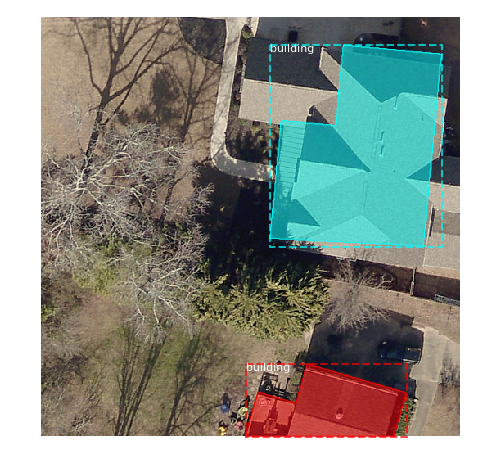

In [194]:
# Test on a random image
image_id = random.choice(dataset_val.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, inference_config, 
                           image_id, use_mini_mask=False)
print (image_id)
log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)
visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset.class_names, figsize=(8, 8))

Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:  142.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.35425  max:    1.22900  float32


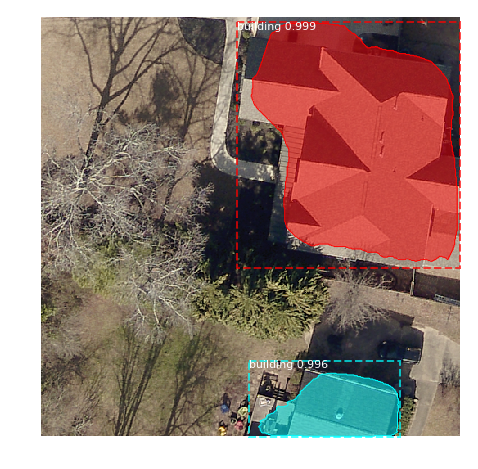

In [195]:
results = model.detect([original_image], verbose=1)

r = results[0]
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_val.class_names, r['scores'], ax=get_ax())

(3, 512, 512)


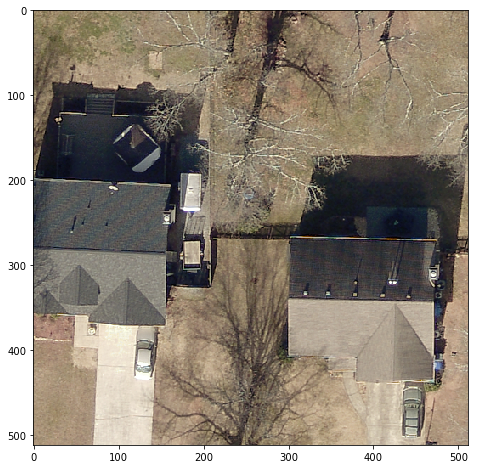

In [167]:
gtif=gdal.Open(os.path.join(DATASET_DIR, "images1/000005871.tif"))
img_arbitrary1 = np.array(gtif.ReadAsArray())
print(img_arbitrary1.shape)
img_show1=np.rollaxis(img_arbitrary1, 0, 3)
f = plt.figure(figsize=(16,8))
implot=plt.imshow(img_show1)

Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.35425  max:    1.22900  float32


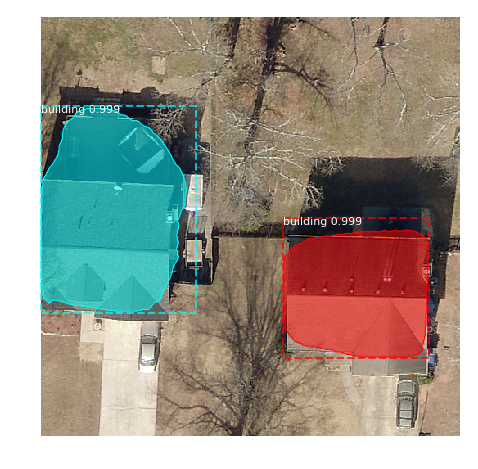

In [168]:
results = model.detect([img_show1], verbose=1)

r = results[0]
visualize.display_instances(img_show1, r['rois'], r['masks'], r['class_ids'], 
                            dataset_val.class_names, r['scores'], ax=get_ax())

(3, 512, 512)


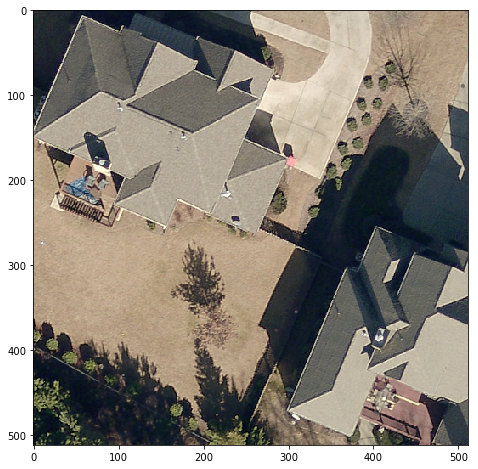

In [174]:
gtif=gdal.Open(os.path.join(DATASET_DIR, "images1/000007799.tif"))
img_arbitrary2 = np.array(gtif.ReadAsArray())
print(img_arbitrary2.shape)
img_show2=np.transpose(img_arbitrary2, [1,2,0])
f = plt.figure(figsize=(16,8))
implot=plt.imshow(img_show2)

Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.35425  max:    1.22900  float32


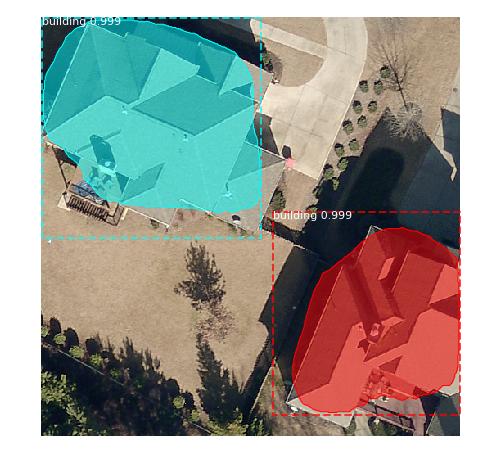

In [175]:
results2 = model.detect([img_show2], verbose=1)

r2 = results2[0]
visualize.display_instances(img_show2, r2['rois'], r2['masks'], r2['class_ids'], 
                            dataset_val.class_names, r2['scores'], ax=get_ax())

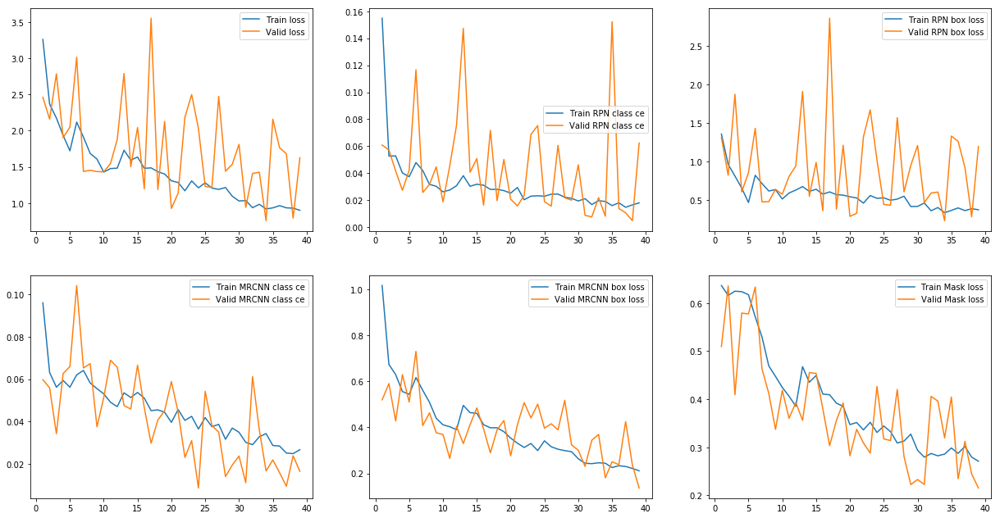

In [134]:
epochs = range(1, len(history['loss'])+1)
plt.figure(figsize=(21,11))

plt.subplot(231)
plt.plot(epochs, history["loss"], label="Train loss")
plt.plot(epochs, history["val_loss"], label="Valid loss")
plt.legend()
plt.subplot(232)
plt.plot(epochs, history["rpn_class_loss"], label="Train RPN class ce")
plt.plot(epochs, history["val_rpn_class_loss"], label="Valid RPN class ce")
plt.legend()
plt.subplot(233)
plt.plot(epochs, history["rpn_bbox_loss"], label="Train RPN box loss")
plt.plot(epochs, history["val_rpn_bbox_loss"], label="Valid RPN box loss")
plt.legend()
plt.subplot(234)
plt.plot(epochs, history["mrcnn_class_loss"], label="Train MRCNN class ce")
plt.plot(epochs, history["val_mrcnn_class_loss"], label="Valid MRCNN class ce")
plt.legend()
plt.subplot(235)
plt.plot(epochs, history["mrcnn_bbox_loss"], label="Train MRCNN box loss")
plt.plot(epochs, history["val_mrcnn_bbox_loss"], label="Valid MRCNN box loss")
plt.legend()
plt.subplot(236)
plt.plot(epochs, history["mrcnn_mask_loss"], label="Train Mask loss")
plt.plot(epochs, history["val_mrcnn_mask_loss"], label="Valid Mask loss")
plt.legend()

plt.show()

In [240]:
def get_cropped_data(image, bounds):
    a, b, c, d = bounds
    return np.asarray(image[:, int(a) : int((a + c)), int(b) : int(b + d)], dtype=np.float32)
def enumerate_squares(image, batch_size, block_size, padding):
    c, w, h = image.shape

    features = np.ones((int(batch_size), c, block_size, block_size), dtype=np.float32)
    coords = list(range(int(batch_size)))

    x_coords = [min((block_size - 2 * padding) * i, w - block_size) for i in
                range(int((w - padding) / (block_size - 2 * padding)))]
    y_coords = [min((block_size - 2 * padding) * i, h - block_size) for i in
                range(int((h - padding) / (block_size - 2 * padding)))]

    c_squares = 0
    for i in x_coords:
        for j in y_coords:
            bounds = (i, j, block_size, block_size)
            features[c_squares, :, :, :] = get_cropped_data(image, bounds)
            coords[c_squares] = (i, j)
            c_squares += 1
            if c_squares >= batch_size:
                yield c_squares, coords, features
                c_squares = 0

    if c_squares > 0:
        features = features[0:c_squares, :, :, :]
        yield c_squares, coords, features
        

def updatePixels(model, image):
        results = model.detect([image], verbose=0)
        masks = results[0]['masks']
        class_ids = results[0]['class_ids']
        visualize.display_instances(image, results[0]['rois'], masks, class_ids, 
                            dataset_val.class_names, results[0]['scores'], ax=get_ax())
        output_raster = np.zeros((masks.shape[0], masks.shape[1], 1), dtype=np.uint8)
        mask_count = masks.shape[-1]
        for i in range(mask_count):
            mask = masks[:, :, i]
            output_raster[np.where(mask==True)] = class_ids[i]

        return output_raster #np.transpose(output_raster, [2,0,1])


In [241]:
gtif = gdal.Open(r'C:\projects\landClassification\trains\test\c202460_1.tif')

img_arbitrary = np.array(gtif.ReadAsArray())
print(img_arbitrary.shape)
img_show=np.rollaxis(img_arbitrary, 0, 3)

(3, 2168, 2153)


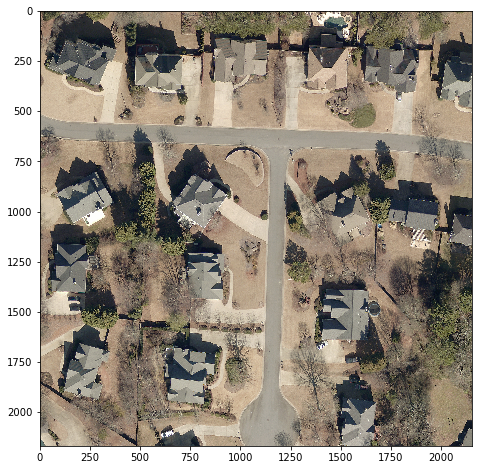

In [242]:
f = plt.figure(figsize=(16,8))
plt.imshow(img_show)
plt.show()

In [234]:
c,w,h=img_arbitrary.shape
output_data = np.zeros(( w, h), dtype=np.uint8)  # we want the probability of each class

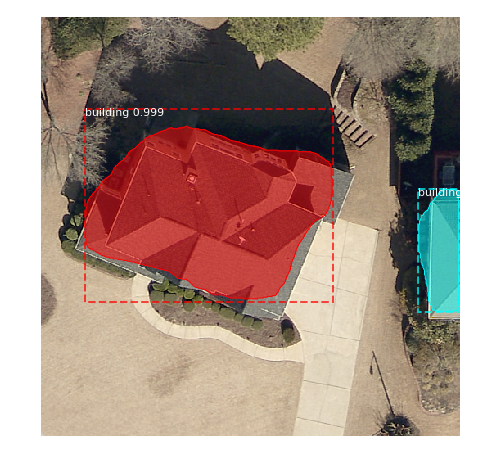

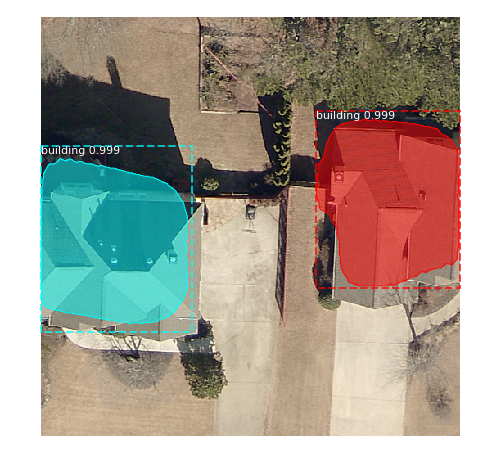

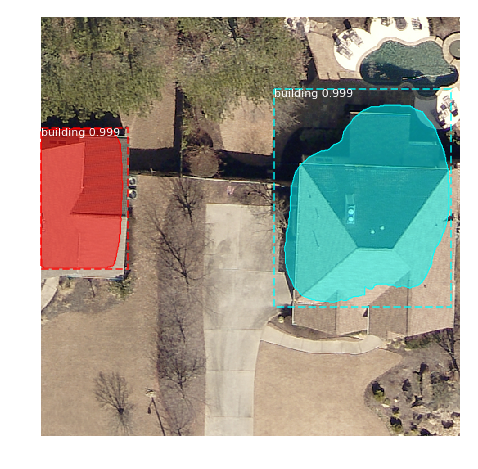

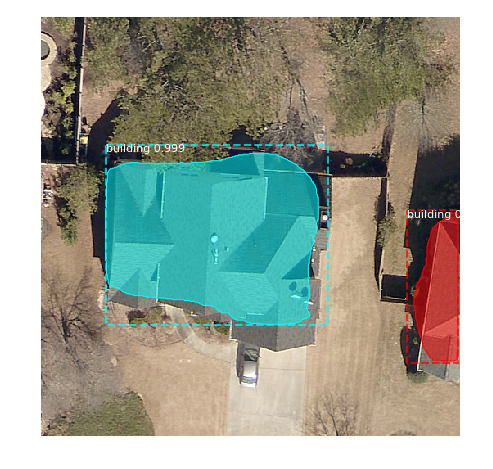

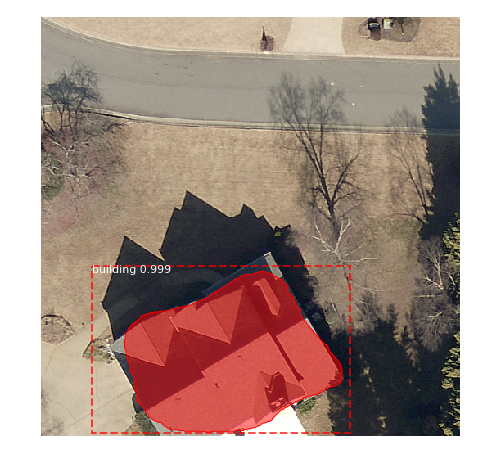

...

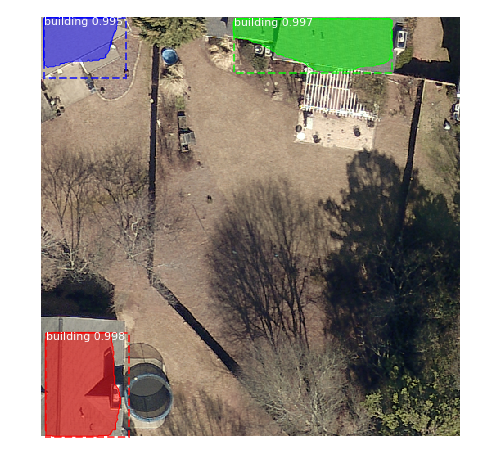

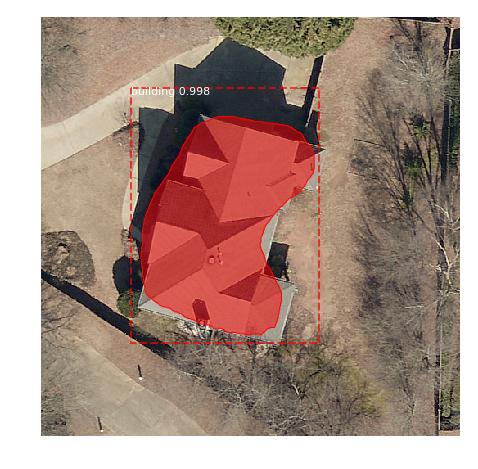

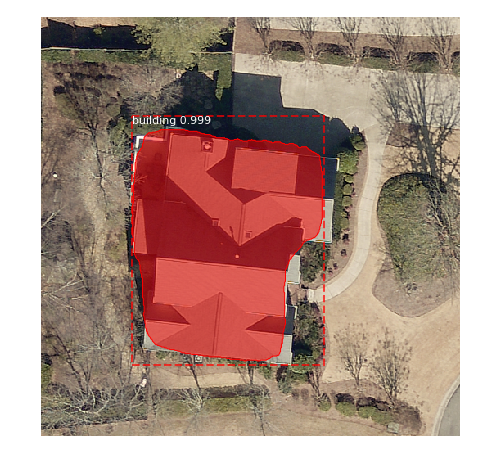

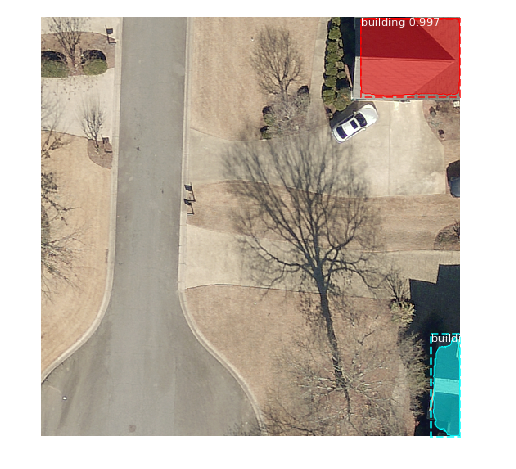

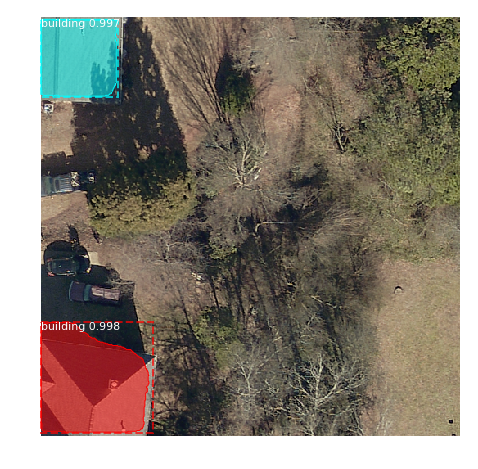

In [243]:
predict_c, output_data= classify_tile(model, img_arbitrary, output_data, block_size=512, batch_size=16)

In [228]:
# Let's define the standard  color palette
palette = {0 : (255, 255, 255), # Impervious surfaces (white)
           1 : (0, 0, 255),     # Buildings (blue)
           2 : (0, 255, 255),   # roads and parking lot (cyan)
           3 : (0, 255, 0),     # Vegetation (green)
           4 : (255, 255, 0),   #  (yellow)
           5 : (255, 0, 0),     #  (red)
           6 : (0, 0, 0)}       # barren (black)

invert_palette = {v: k for k, v in palette.items()}

def convert_to_color(arr_2d, palette=palette):
    """ Numeric labels to RGB-color encoding """
    arr_3d = np.zeros((arr_2d.shape[0], arr_2d.shape[1], 3), dtype=np.uint8)

    for c, i in palette.items():
        m = arr_2d == c
        arr_3d[m] = i

    return arr_3d

def convert_from_color(arr_3d, palette=invert_palette):
    """ RGB-color encoding to grayscale labels """
    arr_2d = np.zeros((arr_3d.shape[0], arr_3d.shape[1]), dtype=np.uint8)

    for c, i in palette.items():
        m = np.all(arr_3d == np.array(c).reshape(1, 1, 3), axis=2)
        arr_2d[m] = i

    return arr_2d


In [245]:
colorimg=convert_to_color(output_data, palette=palette)

Text(0.5,1,'Prediction')

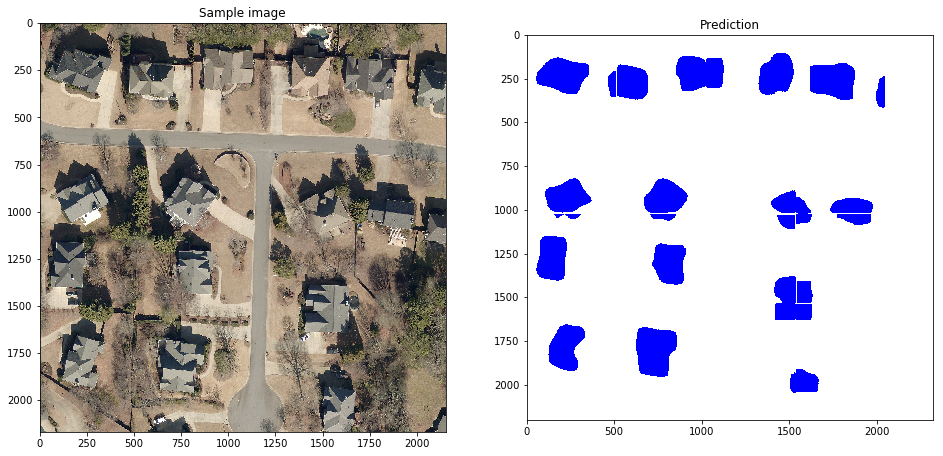

In [246]:
fig = plt.figure(figsize=(16,8))
a=fig.add_subplot(1,2,1)
implot=plt.imshow(img_show)

a.set_title('Sample image')
#plt.colorbar(ticks=[0.1, 0.3, 0.5, 0.7], orientation='horizontal')
a = fig.add_subplot(1, 2, 2)
imgplot = plt.imshow(colorimg)
#imgplot.set_clim(0.0, 0.7)
a.set_title('Prediction')
#plt.colorbar(ticks=[0.1, 0.3, 0.5, 0.7], orientation='horizontal')

In [274]:
x = np.array([1,1,1,2,2,2,5,25,1,1])
unique, counts = np.unique(x, return_counts=True)
freq=np.asarray((unique, counts)).T
print (freq[np.where(unique == 5)[0][0],1])

1


In [1]:
unique, counts = np.unique(img_arbitrary, return_counts = True)
freq           = np.asarray((unique, counts)).T
#print (freq)   
#print(freq[np.where(unique == 1)[0][0], 1])

NameError: name 'np' is not defined